In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import csv
from scipy.signal import resample_poly

from pathlib import Path
import glob
import shutil
import os
import pickle

import sys
sys.path.append('/storage3/eva/code/neuropixels/src')
import path_formatting as pf
import motive
import oe

In [3]:
date = "20250718" # change this according to ur session
animal = "eb02"

oe_sr = 30000
m_sr = 120

pyr = [7,26,45,53,56,64,68,79,83,89,90,115,125,137,167,178,183,189,228,230,232,233,234,256,403,414,426,427,428,429,430,434,441,444,445,446,455,457,458,460,470,471,472,473,474,475,476,477,494,495,512,513,516,519,545]
inter = [70,78,105,110,138,153,154,204,220,227,492,493]

csv_path = rf'X:\eva\data\processed\{animal}\{animal}_{date}\motive\out_csv'
csv_path = pf.w2l(csv_path)

dat_path = rf'X:\eva\data\raw\oe\{animal}\{animal}_{date}\continuous.dat'
dat_path = pf.w2l(dat_path)

ks_path = rf'X:\eva\data\processed\{animal}\{animal}_{date}\kilosort'
ks_path = pf.w2l(ks_path)

res_path = rf'X:\eva\code\neuropixels\results\{animal}\{animal}_{date}'
res_path = pf.w2l(res_path)
os.makedirs(res_path, exist_ok=True) # Create the folder if it doesn't exist

pitch_path = Path(res_path) / "pitch"
pitch_path.mkdir(parents=True, exist_ok=True) # Create the folder if it doesn't exist

csv_path, dat_path, ks_path, res_path, pitch_path

('/storage3/eva/data/processed/eb02/eb02_20250718/motive/out_csv',
 '/storage3/eva/data/raw/oe/eb02/eb02_20250718/continuous.dat',
 '/storage3/eva/data/processed/eb02/eb02_20250718/kilosort',
 '/storage3/eva/code/neuropixels/results/eb02/eb02_20250718',
 PosixPath('/storage3/eva/code/neuropixels/results/eb02/eb02_20250718/pitch'))

In [4]:
goodspiketimes = oe.ks_load(ks_path)
res_path_path = Path(res_path)
with open(res_path_path / f"behav_periods_{animal}_{date}.pkl", "rb") as f:
    periods = pickle.load(f)

Sup! U have...
73 phy-good clusters


In [25]:
goodspiketimes.keys()

dict_keys([7, 19, 26, 45, 53, 56, 64, 68, 70, 78, 79, 83, 89, 90, 105, 110, 115, 125, 137, 138, 153, 154, 167, 178, 183, 189, 194, 195, 204, 220, 227, 228, 230, 232, 233, 234, 248, 256, 403, 413, 414, 426, 427, 428, 429, 430, 434, 441, 444, 445, 446, 455, 457, 458, 460, 470, 471, 472, 473, 474, 475, 476, 477, 492, 493, 494, 495, 512, 513, 516, 519, 545, 546])

In [5]:
csv_dict = motive.get_csv_dict(csv_path)
with open(res_path_path / f"behav_periods_{animal}_{date}.pkl", "rb") as f:
    periods = pickle.load(f)
of_keys = list(periods.keys())[1::2] # ['of1', 'of2', 'of3']
motive_keys = [f'{date}_2',f'{date}_4',f'{date}_6']
meta = dict(zip(of_keys, motive_keys))

In [9]:
with open(res_path_path/"smooth_pitch_dict.pkl", "rb") as f:
    smooth_pitch_dict = waveform_dict = pickle.load(f)

smooth_pitch_dict_inv = {}

for of in of_keys:
    smooth_pitch_dict_inv[of] = smooth_pitch_dict[of]*(-1) 
smooth_pitch_dict_inv

{'of1': array([-48.4039854 , -48.40342441, -48.40230094, ...,   9.62115492,
          9.62118066,   9.62119365], shape=(220314,)),
 'of2': array([-42.21511517, -42.21355916, -42.21044715, ..., -17.01742332,
        -17.01625288, -17.01566753], shape=(218449,)),
 'of3': array([-21.27434925, -21.26850978, -21.25683503, ...,  18.28288161,
         18.28614089,  18.28777075], shape=(251091,))}

In [6]:
trial_key = 'of1'
df = csv_dict[meta[trial_key]]

In [7]:
start, end = periods[trial_key]
goodspiketimes_period = {
    unit: spikes[(spikes >= start) & (spikes <= end)] - start
    for unit, spikes in goodspiketimes.items()
}
goodspiketimes_sec = {unit: spikes / oe_sr for unit, spikes in goodspiketimes_period.items()}

In [8]:
from scipy.ndimage import gaussian_filter1d

t = motive.get_frame_times(df)
_, arrays_interpol = motive.get_arrays(df, metric='Position', dim_array = ['X','Y','Z'], interpolate=True)
x = arrays_interpol['X']
y = arrays_interpol['Y']
y = gaussian_filter1d(y, sigma=int(120*0.5))
z = arrays_interpol['Z']
pitch = smooth_pitch_dict_inv[trial_key] # note that angles sign is inverted!!!!
_,_,v = motive.speed(arrays_interpol['X'], arrays_interpol['Z'], t)

t.shape, x.shape, y.shape, z.shape, pitch.shape, v.shape

((220314,), (220314,), (220314,), (220314,), (220314,), (220314,))

## 3d tuning: pitch, x, z

In [9]:
speed_cutoff = 0.02 # 2cm/s
y_thresh = 0.15 #15cm

speed_mask = (y >= y_thresh) | (v > speed_cutoff)

In [10]:
bin_pitch = 5.0   # 5° bins (try 2° if you want finer)
bin_y = 0.01  # 1 cm bins
bin_xz = 0.05

pitch_edges = np.arange(pitch.min(), pitch.max() + bin_pitch, bin_pitch)
x_edges     = np.arange(x.min(), x.max() + bin_xz, bin_xz)
z_edges     = np.arange(z.min(), z.max() + bin_xz, bin_xz)
y_edges     = np.arange(y.min(), y.max() + bin_y, bin_y)

In [11]:
x_run  = x[speed_mask]
z_run  = z[speed_mask]
y_run  = y[speed_mask]
pitch_run = pitch[speed_mask]

In [12]:
# oe data resampling - samples of 120freq with spike events
spikes_resampled = {unit: (spikes*m_sr).astype(int) for unit, spikes in goodspiketimes_sec.items()}

In [13]:
from scipy.ndimage import gaussian_filter
sigma = 1

occ_counts, _ = np.histogramdd(
    sample=(pitch_run, x_run, z_run),
    bins=(pitch_edges, x_edges, z_edges)
)

occupancy_seconds = occ_counts / m_sr
occupancy_smooth = gaussian_filter(occupancy_seconds, sigma=sigma)
occupancy_mask = (occupancy_seconds == 0) | (occupancy_smooth < 1.0)

occupancy_smooth_masked = np.where(occupancy_mask, np.nan, occupancy_smooth)

In [14]:
occupancy_smooth_masked.shape # pitch_run, x_run, z_run

(31, 19, 21)

In [15]:
spike_maps = {}

for cell_id, spike_idxs in spikes_resampled.items():
    # Keep only spikes during movement
    spike_idxs_moving = spike_idxs[spike_idxs < len(speed_mask)]
    spike_idxs_moving = spike_idxs_moving[speed_mask[spike_idxs_moving]]

    # Get corresponding positions of spikes
    spike_p = pitch[spike_idxs_moving]
    spike_x = x[spike_idxs_moving]
    spike_z = z[spike_idxs_moving]

    spike_count_map, _ = np.histogramdd(sample=(spike_p, spike_x, spike_z), bins=(pitch_edges, x_edges, z_edges))
    
    # Smooth
    spike_map_smooth = gaussian_filter(spike_count_map, sigma=sigma)
    spike_map_smooth_masked = np.where(occupancy_mask, np.nan, spike_map_smooth)

    spike_maps[cell_id] = spike_map_smooth_masked

In [16]:
place_fields = {}
for cell_id, spike_map_smooth_masked in spike_maps.items():
    rate_map = spike_map_smooth_masked / occupancy_smooth_masked
    place_fields[cell_id] = rate_map

In [17]:

a = np.array([1, 2, 3, 4, 5])
b = np.array([2, 3, 4, 5, 6])

aa = np.array([1, 3, 3, 4, 5])
bb = np.array([2, 2, 4, 5, 6])

r = np.corrcoef(a, b)[0, 1]  # take off-diagonal
rr = np.corrcoef(aa, bb)[0, 1]
print(r),print(rr)

0.9999999999999999
0.8668451156610704


(None, None)

In [18]:
place_fields[7].shape

(31, 19, 21)

In [19]:
place_fields[70]

array([[[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [        nan,         nan, 13.74248996, ...,  

## Now we can split into quadrants

In [20]:
# split arena into quadrants 3x3
x_q_edges = np.linspace(x.min(), x.max(), 4) # 3 bins = 4 edges
z_q_edges = np.linspace(z.min(), z.max(), 4)

In [21]:
quadrant_fields = {}


# find bin indices where each quadrant starts and ends
x_bin_edges = x_edges  # length = n_x + 1
z_bin_edges = z_edges  # length = n_z + 1

# convert real-world quadrant edges to bin indices
x_bins_idx = np.searchsorted(x_bin_edges, x_q_edges)
z_bins_idx = np.searchsorted(z_bin_edges, z_q_edges)

In [22]:
from scipy.ndimage import zoom

target_shape = (6, 6)  # x, z per quadrant
# without this quadrants are not equal...
# quadrant_fields[7]['q00'].shape, quadrant_fields[26]['q10'].shape
# ((31, 49), (31, 42)) --> if 7 --> 49; if 6 -->36

def resample_map(sub_map, target_shape):
    n_pitch, x_bins, z_bins = sub_map.shape
    zoom_x = target_shape[0] / x_bins
    zoom_z = target_shape[1] / z_bins

    # Apply zoom for each pitch slice
    resampled = np.zeros((n_pitch, *target_shape), dtype=sub_map.dtype)
    for p in range(n_pitch):
        resampled[p] = zoom(sub_map[p], (zoom_x, zoom_z), order=1)
    return resampled

In [23]:
for unit, rate_map in place_fields.items():
    n_pitch = rate_map.shape[0]
    quadrant_fields[unit] = {}

    for i in range(3):  # x
        for j in range(3):  # z
            q_label = f'q{i}{j}'

            x_start = x_bins_idx[i]
            x_end   = x_bins_idx[i+1]
            z_start = z_bins_idx[j]
            z_end   = z_bins_idx[j+1]

            # slice and flatten
            sub_map = rate_map[:, x_start:x_end, z_start:z_end]  # (pitch, x, z)
            resampled = resample_map(sub_map, (6, 6))
            sub_map_flat = resampled.reshape(n_pitch, -1)           # (pitch, xz_flat)

            quadrant_fields[unit][q_label] = sub_map_flat


In [24]:
quadrant_fields[7]['q00'].shape, quadrant_fields[26]['q10'].shape

((31, 36), (31, 36))

## NMF theory

`X = W@H`

- X - ur matrix (n,m)
- W - (n, n_components) - each row - how much this factor is used to build X
- H - (n_components, m) - each row is a factor

### We try on X(pitch_bins, xz_flattened_bins)

- to see shared spatial motifs (columns of H) that are combined across pitch bins (rows of W)
- W → Weight of each motif per pitch bin
- H → Spatial motif (flattened xz) per component

In [25]:
from sklearn.decomposition import NMF
n_components = 3

nmf_pitch_xz = {}

u = list(quadrant_fields.keys())[0]
q_n = len(list(quadrant_fields[u].keys()))

for unit in quadrant_fields.keys():
    try:

        nmf_pitch_xz[unit] = {}

        m = quadrant_fields[unit]['q00'].shape[0]
        n = quadrant_fields[unit]['q00'].shape[1]

        W_q = np.zeros((n, n_components, q_n))
        H_q = np.zeros((n_components, m, q_n))

        for q in quadrant_fields[unit].keys():
            X = quadrant_fields[unit][q]
            valid_cols = ~np.any(np.isnan(X), axis=0) 
            X_valid = X[:, valid_cols]
            model = NMF(n_components=n_components, init='nndsvda', max_iter=1000)
            W = model.fit_transform(X_valid) # (31, 3)
            H = model.components_  # shape: (3, N_valid) but i want (3, 36)
            H_full = np.full((H.shape[0], X.shape[1]), np.nan)  # shape: (3, 36)
            H_full[:, valid_cols] = H

            W_q[:,:,q] = W
            H_q[:,:,q] = H_full
        
        nmf_pitch_xz[unit]['W'] = W_q
        nmf_pitch_xz[unit]['H'] = H_q
    except:
        continue

In [26]:

from sklearn.decomposition import NMF
n_components = 3

nmf_pitch_xz = {}

u = list(quadrant_fields.keys())[0]
q_n = len(list(quadrant_fields[u].keys()))

for unit in inter:

    nmf_pitch_xz[unit] = {}

    m = quadrant_fields[unit]['q00'].shape[0]
    n = quadrant_fields[unit]['q00'].shape[1]

    W_q = np.zeros((n, n_components, q_n))
    H_q = np.zeros((n_components, m, q_n))

    for q in quadrant_fields[unit].keys():
        X = quadrant_fields[unit][q]
        valid_cols = ~np.any(np.isnan(X), axis=0) 
        X_valid = X[:, valid_cols]
        model = NMF(n_components=n_components, init='nndsvda', max_iter=1000)
        W = model.fit_transform(X_valid) # (31, 3)
        H = model.components_  # shape: (3, N_valid) but i want (3, 36)
        H_full = np.full((H.shape[0], X.shape[1]), np.nan)  # shape: (3, 36)
        H_full[:, valid_cols] = H

        W_q[:,:,q] = W
        H_q[:,:,q] = H_full
    
    nmf_pitch_xz[unit]['W'] = W_q
    nmf_pitch_xz[unit]['H'] = H_q

ValueError: Found array with 0 feature(s) (shape=(31, 0)) while a minimum of 1 is required by NMF.

In [ ]:
for unit in inter:
    print(f'unit {unit}')

    for q in quadrant_fields[unit].keys():
        X = quadrant_fields[unit][q]
        valid_cols = ~np.any(np.isnan(X), axis=0) 
        X_valid = X[:, valid_cols]
        print(f'X{X.shape}, nan_n:{np.sum(np.isnan(X))}, X_valid:{X_valid.shape}')

        


unit 70
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1114, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1005, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
unit 78
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1114, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1005, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
unit 105
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1114, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1116, X_valid:(31, 0)
X(31, 36), nan_n:1005, X_valid:(31, 0)


In [ ]:
nmf_pitch_xz

{7: {},
 19: {},
 26: {},
 45: {},
 53: {},
 56: {},
 64: {},
 68: {},
 70: {},
 78: {},
 79: {},
 83: {},
 89: {},
 90: {},
 105: {},
 110: {},
 115: {},
 125: {},
 137: {},
 138: {},
 153: {},
 154: {},
 167: {},
 178: {},
 183: {},
 189: {},
 194: {},
 195: {},
 204: {},
 220: {},
 227: {},
 228: {},
 230: {},
 232: {},
 233: {},
 234: {},
 248: {},
 256: {},
 403: {},
 413: {},
 414: {},
 426: {},
 427: {},
 428: {},
 429: {},
 430: {},
 434: {},
 441: {},
 444: {},
 445: {},
 446: {},
 455: {},
 457: {},
 458: {},
 460: {},
 470: {},
 471: {},
 472: {},
 473: {},
 474: {},
 475: {},
 476: {},
 477: {},
 492: {},
 493: {},
 494: {},
 495: {},
 512: {},
 513: {},
 516: {},
 519: {},
 545: {},
 546: {}}

In [ ]:
quadrant_fields[7]

{'q00': array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]], shape=(31, 49)),
 'q01': array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]], shape=(31, 49)),
 'q02': array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]], shape=(31, 49)),
 'q10': array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, 

Loop over each of the 9 quadrants

For each quadrant:
- Restrict data using logical mask
- Bin X and Z in 5 cm
- Bin pitch in 5°
- Compute occupancy in 2D grid: [pitch_bin, spatial_bin]
- For each unit, compute spike count in the same grid
- Divide → firing rate

In [ ]:
bin_pitch = 5.0   # 5° bins (try 2° if you want finer)
bin_y       = 0.01  # 1 cm bins
bin_xz = 0.05

pitch_edges = np.arange(pitch.min(), pitch.max()  + bin_pitch, bin_pitch)
y_edges = np.arange(y.min(), y.max()  + bin_y, bin_y)

pitch_bin_idx = np.digitize(pitch, pitch_edges) - 1
y_bin_idx = np.digitize(y, y_edges) - 1

# x_edges = np.arange(x.min(), x.max()  + bin_xz, bin_xz)
# z_edges = np.arange(z.min(), z.max()  + bin_xz, bin_xz)

# m_sr = 120

sigma = 1.0  # adjust as needed (in bins)

In [ ]:
# Result containers
occupancy_dict = {}  # key: 'q{i}{j}'
spike_dict_per_unit = {}  # key: unit → q_label → matrix
firing_rate_dict = {}

In [ ]:
from scipy.ndimage import gaussian_filter

for i in range(3):  # x axis
    for j in range(3):  # z axis
        q_label = f'q{i}{j}'

        # mask
        x_mask = (x >= x_thirds[i]) & (x < x_thirds[i+1]) if i < 2 else (x >= x_thirds[i]) & (x <= x_thirds[i+1])
        z_mask = (z >= z_thirds[j]) & (z < z_thirds[j+1]) if j < 2 else (z >= z_thirds[j]) & (z <= z_thirds[j+1])
        quadrant_mask = x_mask & z_mask
        mask = quadrant_mask & speed_mask

        # get relevant data
        x_q = x[mask]
        z_q = z[mask]
        pitch_q = pitch[mask]
        pitch_idx_q = pitch_bin_idx[mask]

        # spatial bin edges
        x_edges = np.arange(x[quadrant_mask].min(), x[quadrant_mask].max() + bin_xz, bin_xz)
        z_edges = np.arange(z[quadrant_mask].min(), z[quadrant_mask].max() + bin_xz, bin_xz)
        x_bin = np.digitize(x_q, x_edges) - 1
        z_bin = np.digitize(z_q, z_edges) - 1
        # spatial_flat = x_bin * len(z_edges) + z_bin  # flattened index
        n_xbins = len(x_edges) - 1
        n_zbins = len(z_edges) - 1
        n_pitch_bins = len(pitch_edges) - 1


        # bin x/z
        x_bin = np.digitize(x_q, x_edges) - 1
        z_bin = np.digitize(z_q, z_edges) - 1

        # filter invalid indices
        valid = (x_bin >= 0) & (x_bin < n_xbins) & \
                (z_bin >= 0) & (z_bin < n_zbins) & \
                (pitch_idx_q >= 0) & (pitch_idx_q < n_pitch_bins)
        x_bin = x_bin[valid]
        z_bin = z_bin[valid]
        p_bin = pitch_idx_q[valid]

        # accumulate into 3D occupancy grid
        occ_3d = np.zeros((n_pitch_bins, n_xbins, n_zbins), dtype=np.float32)
        for p, xb, zb in zip(p_bin, x_bin, z_bin):
            occ_3d[p, xb, zb] += 1

        # convert to seconds & smooth
        occ_3d_sec = occ_3d / m_sr
        occ_3d_smooth = gaussian_filter(occ_3d_sec, sigma=sigma)  # sigma can be (σ_pitch, σ_x, σ_z)

        # flatten x/z after smoothing
        occ_flat = occ_3d_smooth.reshape(n_pitch_bins, -1)
        occupancy_dict[q_label] = occ_flat

In [ ]:
for i in range(3):       # x axis (cols)
    for j in range(3):   # z axis (rows)
        mask = (
            (x >= x_thirds[i]) & (x < x_thirds[i+1]) &
            (z >= z_thirds[j]) & (z < z_thirds[j+1])
        )
        label = f"q{i}{j}"
        quadrant_masks[label] = mask

In [ ]:
# Occupancy matrix [pitch_bin, spatial_bin] for each quadrant

occupancy_dict = {}  # key = quadrant_id, value = 2D matrix

for q in range(9):
    mask = (quadrant_idx == q)

    # bin timepoints by pitch & space
    bin_matrix, _, _ = np.histogram2d(
        pitch_bin_idx[mask],
        flat_spatial_idx[mask],
        bins=[len(pitch_bins), len(x_edges)*len(z_edges)]
    )
    occupancy_dict[q] = bin_matrix

## FA on pitch-fr

In [ ]:
pitch_data = {}

for of in of_keys:
    with open(f"{pitch_path}/pf_data_dict1d_{of}_{date}.pkl", "rb") as f:
        pf_data_dict1d = pickle.load(f)
        pitch_data[of] = pf_data_dict1d

In [ ]:
pitch_centers = pitch_data['of1']['pitch_centers']

In [ ]:
pitch_data['of1']['rm'][154].shape[0], pitch_data['of2']['rm'][154].shape, pitch_data['of3']['rm'][154].shape

(36, (36,), (36,))

In [ ]:
from sklearn.decomposition import FactorAnalysis

def fa_quick(unit_list, cell_type): # inter or pyr

    # make X: rows - cells in of1,2,3; cols - pitch
    pitch_bin_n = pitch_data['of1']['rm'][unit_list[0]].shape[0]

    X = np.zeros((int(len(unit_list)*3), pitch_bin_n))
    for i, unit in enumerate(unit_list):
        for j, of in enumerate(of_keys):
            X[i * 3 + j, :] = pitch_data[of]['rm'][unit]

    X = np.nan_to_num(X, nan=0.0)    
    X = X[~np.all(X == 0, axis=1)]  # remove all-zero rows
    X_z = (X - X.mean(axis=1, keepdims=True)) / X.std(axis=1, keepdims=True)

    # --- Fit FA with 3 components for first visualization
    fa = FactorAnalysis(n_components=3, random_state=0)
    Z3 = fa.fit_transform(X_z)
    components3 = fa.components_

    # --- Log-likelihood sweep
    n_trials = range(2, 11)
    log_likelihoods = []
    for n in n_trials:
        fa_tmp = FactorAnalysis(n_components=n, random_state=0)
        fa_tmp.fit(X_z)
        log_likelihoods.append(fa_tmp.score(X_z))

    # --- Fit with more components for loadings/weights heatmaps
    n_components = 10
    fa = FactorAnalysis(n_components=n_components, random_state=0)
    Z = fa.fit_transform(X_z)
    components = fa.components_

    # --- Create 2x2 figure
    fig, axs = plt.subplots(2, 2, figsize=(12, 8))

    # (1) Line plots of first 3 factors
    for i, comp in enumerate(components3):
        axs[0,0].plot(comp, label=f'Factor {i+1}')
    axs[0,0].set_xlabel('Pitch bin')
    axs[0,0].set_ylabel('Weight')
    axs[0,0].set_title(f"{cell_type}: First 3 FA components")
    axs[0,0].legend()

    # (2) Log-likelihood sweep
    axs[0,1].plot(n_trials, log_likelihoods, marker='o')
    axs[0,1].set_xlabel('Number of components')
    axs[0,1].set_ylabel('Log-likelihood')
    axs[0,1].set_title(f"{cell_type}: Model fit across components")
    axs[0,1].grid(True)

    # (3) Heatmap of loadings Z
    im1 = axs[1,0].imshow(
        Z, aspect='auto', cmap='bwr', 
        interpolation='nearest', 
        vmin=-np.max(np.abs(Z)), vmax=np.max(np.abs(Z))
    )
    fig.colorbar(im1, ax=axs[1,0], fraction=0.046, pad=0.04, label='Loading strength')
    axs[1,0].set_xlabel('Latent Factors')
    axs[1,0].set_ylabel('Cell × Condition')
    axs[1,0].set_xticks(np.arange(n_components))
    axs[1,0].set_xticklabels([f'F{i+1}' for i in range(n_components)])
    axs[1,0].set_title(f"{cell_type}: Loadings")

    # (4) Heatmap of factor weights across pitch
    im2 = axs[1,1].imshow(
        components, aspect='auto', cmap='viridis',
        interpolation='nearest',
        vmin=-np.max(np.abs(components)), vmax=np.max(np.abs(components))
    )
    fig.colorbar(im2, ax=axs[1,1], fraction=0.046, pad=0.04, label='Weight')
    axs[1,1].set_ylabel('Factors')
    axs[1,1].set_xlabel('Pitch (deg)')
    desired_ticks = [-75, -50, -25, 0, 25, 50, 75]
    tick_indices = [np.argmin(np.abs(pitch_centers - val)) for val in desired_ticks]
    axs[1,1].set_xticks(tick_indices)
    axs[1,1].set_xticklabels(desired_ticks)
    axs[1,1].set_title(f"{cell_type}: Factor weights")

    plt.tight_layout()
    plt.show()

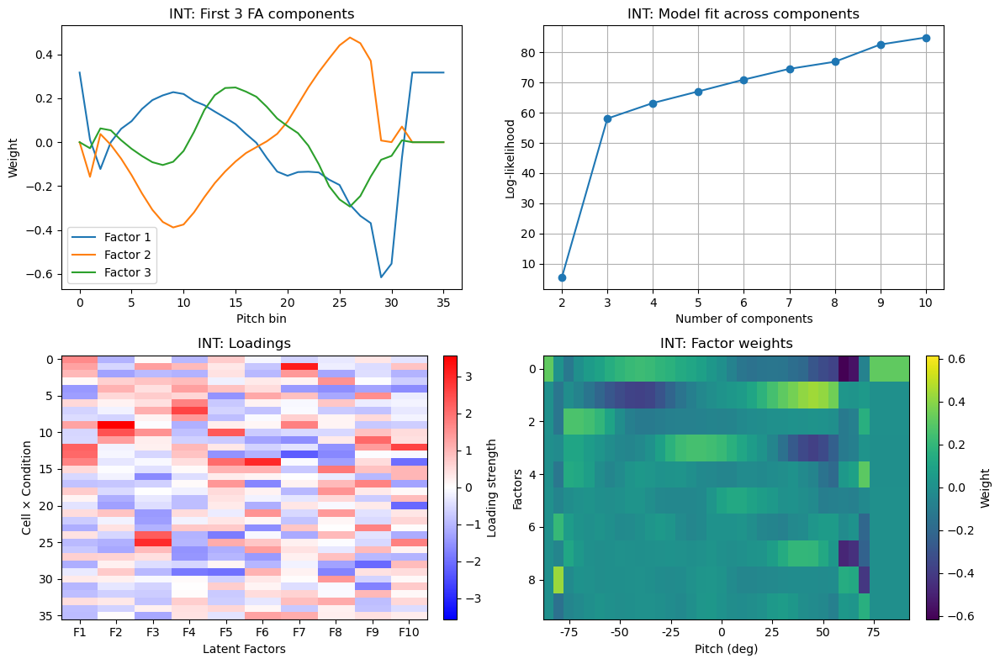

In [ ]:
fa_quick(inter, "INT")

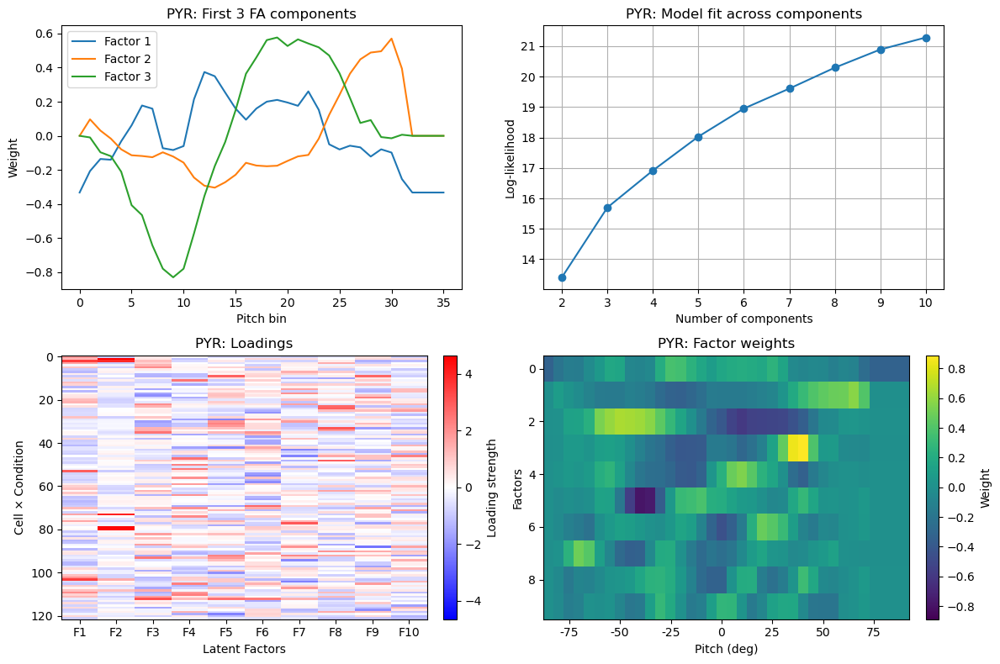

In [ ]:
fa_quick(pyr, "PYR")

## NMF quadrants/pitch

In [15]:
from scipy.ndimage import gaussian_filter1d

In [6]:
of_keys

['of1', 'of2', 'of3']

In [ ]:
behav_dict = {}

spikes_dict = {}
spikes_sec_dict = {}

for of in of_keys:

    behav_dict[of] = {}

    df = csv_dict[meta[of]]

    start, end = periods[of]
    # goodspiketimes_period
    spikes_dict[of] = {
        unit: spikes[(spikes >= start) & (spikes <= end)] - start
        for unit, spikes in goodspiketimes.items()
    }
    # goodspiketimes_sec
    spikes_sec_dict[of] = {unit: spikes / oe_sr for unit, spikes in spikes_dict[of].items()}

    # behav
    behav_dict[of]['t'] = motive.get_frame_times(df)
    _, arrays_interpol = motive.get_arrays(df, metric='Position', dim_array = ['X','Y','Z'], interpolate=True)
    behav_dict[of]['x'] = arrays_interpol['X']
    y = arrays_interpol['Y']
    behav_dict[of]['y'] = gaussian_filter1d(y, sigma=int(120*0.5))
    behav_dict[of]['z'] = arrays_interpol['Z']
    behav_dict[of]['p'] = smooth_pitch_dict_inv[of] # note that angles sign is inverted!!!!
    _,_,behav_dict[of]['v'] = motive.speed(arrays_interpol['X'], arrays_interpol['Z'], behav_dict[of]['t'])

In [18]:
def nice_edges(vmin, vmax, step):
    """Round edges to nearest multiple of step"""
    start = np.floor(vmin/step)*step
    stop  = np.ceil(vmax/step)*step
    return np.arange(start, stop + step, step)

In [ ]:
params_dict = {'m_sr': 120, # motion sr
               'bin_pitch_deg': 5.0, # in bins
               'sigma' : 1,
               'speed_cutoff' : 0.02,  # 2 cm/s
               'y_thresh' : 0.15, # 15 cm (rearing)
               'quadrant_ids' : range(9)
               }

def q_split(of, params_dict):

    '''
    Bins space into quadrants; 
    calculates occupancy, spike map and rate map 
    for pitch dimention in each quadrant
    '''

    # params unpack
    m_sr = params_dict['m_sr']
    bin_pitch_deg = params_dict['bin_pitch_deg']
    sigma = params_dict['sigma']
    speed_cutoff = params_dict['speed_cutoff']
    y_thresh = params_dict['y_thresh']
    quadrant_ids = params_dict['quadrant_ids']

    # spikes unpack
    goodspiketimes_sec = spikes_sec_dict[of]

    # behav unpack
    x = behav_dict[of]['x']
    y = behav_dict[of]['y']
    z = behav_dict[of]['z']
    pitch = behav_dict[of]['p']
    v = behav_dict[of]['v']


    # binning
    pitch_edges   = nice_edges(-90, 90, bin_pitch_deg)
    pitch_centers = 0.5 * (pitch_edges[:-1] + pitch_edges[1:])
    n_pitch_bins  = len(pitch_centers)

    # resample spike times in sec to motive frame samples
    spikes_resampled = {
        unit: (spikes * m_sr).astype(int)
        for unit, spikes in goodspiketimes_sec.items()
    }

    # spatial quadrants
    x_edges = np.linspace(x.min(), x.max(), 4)  # 3 bins → 4 edges
    z_edges = np.linspace(z.min(), z.max(), 4)

    x_bin = np.clip(np.digitize(x, x_edges) - 1, 0, 2)  # → values 0,1,2
    z_bin = np.clip(np.digitize(z, z_edges) - 1, 0, 2)

    q_index = z_bin * 3 + x_bin  # q00=0, q01=1, ..., q22=8

    # speed + rearing mask
    speed_mask = (y >= y_thresh) | (v > speed_cutoff)  # include fast walking or rearing

    # output
    om = {}   # occupancy per pitch bin per quadrant
    sm = {}         # spike maps (counts) per pitch bin
    rm = {}         # rate maps (firing rate) per pitch bin


    # MAIN LOOP: over quadrants
    for q in quadrant_ids:
        sm[q] = {}
        rm[q] = {}

        # Full-frame mask: frames in this quadrant AND during movement
        mask_q_moving = (q_index == q) & speed_mask

        # occupancy
        pitch_q_moving = pitch[mask_q_moving]

        occ_counts, _ = np.histogram(pitch_q_moving, bins=pitch_edges)
        occ_seconds = occ_counts / m_sr 
        occ_smooth = gaussian_filter1d(occ_seconds, sigma=sigma, mode='nearest')

        occ_mask = (occ_seconds == 0) | (occ_smooth < 1.0) 
        occ_smooth_masked = np.where(occ_mask, np.nan, occ_smooth)
        om[q] = occ_smooth_masked

        # spike and rate maps
        for cell_id, spike_idxs in spikes_resampled.items():
            # Guard: spike indices must be in valid range
            valid_spike_idxs = spike_idxs[spike_idxs < len(mask_q_moving)]

            # Select spikes that fall into movement + this quadrant
            spike_idxs_moving = valid_spike_idxs[mask_q_moving[valid_spike_idxs]]

            # Get pitch at those spike times
            spike_pitch = pitch[spike_idxs_moving]

            # Histogram spike counts across pitch bins
            sp_counts, _ = np.histogram(spike_pitch, bins=pitch_edges)
            sp_smooth = gaussian_filter1d(sp_counts, sigma=sigma)
            sp_smooth_masked = np.where(occ_mask, np.nan, sp_smooth)

            sm[q][cell_id] = sp_smooth_masked
            rm[q][cell_id] = sp_smooth_masked / occ_smooth_masked

    return om, sm, rm

In [19]:
q_pitch_rate_dict = {}

for of in of_keys:

    q_pitch_rate_dict[of] = {}
    
    q_pitch_rate_dict[of]['om'], q_pitch_rate_dict[of]['sm'], q_pitch_rate_dict[of]['rm'] = q_split(of, params_dict)

In [22]:
nmf_pitch_path = Path(pitch_path) / "nmf"
nmf_pitch_path.mkdir(parents=True, exist_ok=True)

In [23]:
with open(f"{nmf_pitch_path}/q_pitch_rate_dict_{date}.pkl", "wb") as f:
    pickle.dump(q_pitch_rate_dict, f)

In [21]:
q_pitch_rate_dict[of]['rm']

{0: {7: array([        nan,  4.46237805,  3.94237154,  3.23671658,  3.45378651,
          5.09679551,  8.79763677, 13.50435232, 15.52163327, 15.14541698,
         13.14561953, 10.0003335 ,  7.00822203,  6.21151457,  6.50065275,
          6.50072794,  6.50455352,  7.07515785,  7.55258797,  6.89232464,
          6.64353376,  6.46625937,  6.33097601,  5.90302262,  5.8101308 ,
          4.92350389,  4.0041462 ,  4.44016052,  5.74341774,  5.7188886 ,
                 nan,         nan,         nan,         nan,         nan,
                 nan]),
  19: array([        nan, 14.3787737 , 14.37806092, 13.62828036, 12.91415827,
         12.81480015, 13.63014147, 13.90388937, 13.23247153, 12.78230227,
         12.94337923, 13.04805418, 12.41807764, 11.57600442, 10.94846779,
         10.83454656, 11.32274131, 11.87615781, 12.86737209, 12.9231087 ,
         11.75394434, 10.6231404 , 10.38280066, 10.49426244,  9.68355133,
          8.71081458,  7.20746317,  5.77220868,  5.74341774,  5.7188886 ,
    

In [30]:
from matplotlib import cm
from matplotlib.colors import Normalize

def q_behav_plot(unit, rm, save=False):

    pitch_edges   = nice_edges(-90, 90, params_dict['bin_pitch_deg'])
    pitch_centers = 0.5 * (pitch_edges[:-1] + pitch_edges[1:])
    
    fig, axs = plt.subplots(3, 3, figsize=(10,8), sharex=True, sharey=True) 
    axs = axs.flatten()  # so we can index by 0..8

    for q, ax in enumerate(axs):
        if q not in rm:
            ax.axis('off')
            continue

        rm_unit = rm[q][unit]
        
        # Normalize for this unit
        norm = Normalize(vmin=np.nanmin(rm_unit), vmax=np.nanmax(rm_unit))
        cmap = cm.Spectral_r
        colors = [
            'lightgrey' if np.isnan(val) else cmap(norm(val))
            for val in rm_unit
        ]

        # Plot as bar (you could also do line if cleaner)
        ax.bar(
            pitch_centers, 
            np.nan_to_num(rm_unit), 
            width=params_dict['bin_pitch_deg'], 
            color=colors, 
            edgecolor='k'
        )

        ax.set_title(f'Quadrant {q}')
        ax.set_xlabel('Head pitch [°]')
        ax.set_ylabel('Firing rate [Hz]')

    plt.tight_layout()
    filename = f'pitch_q_1d_unit{unit}_{of}_{date}'
    plt.suptitle(filename, fontsize=16, y=1.02)

    if save:
        plt.savefig(nmf_pitch_path/f'{filename}.png', dpi=300, bbox_inches='tight')
    if unit == list(goodspiketimes.keys())[0]:
        plt.show()
    plt.close()

In [24]:
q_pitch_rate_dict[of]['rm'][0].keys()

dict_keys([7, 19, 26, 45, 53, 56, 64, 68, 70, 78, 79, 83, 89, 90, 105, 110, 115, 125, 137, 138, 153, 154, 167, 178, 183, 189, 194, 195, 204, 220, 227, 228, 230, 232, 233, 234, 248, 256, 403, 413, 414, 426, 427, 428, 429, 430, 434, 441, 444, 445, 446, 455, 457, 458, 460, 470, 471, 472, 473, 474, 475, 476, 477, 492, 493, 494, 495, 512, 513, 516, 519, 545, 546])

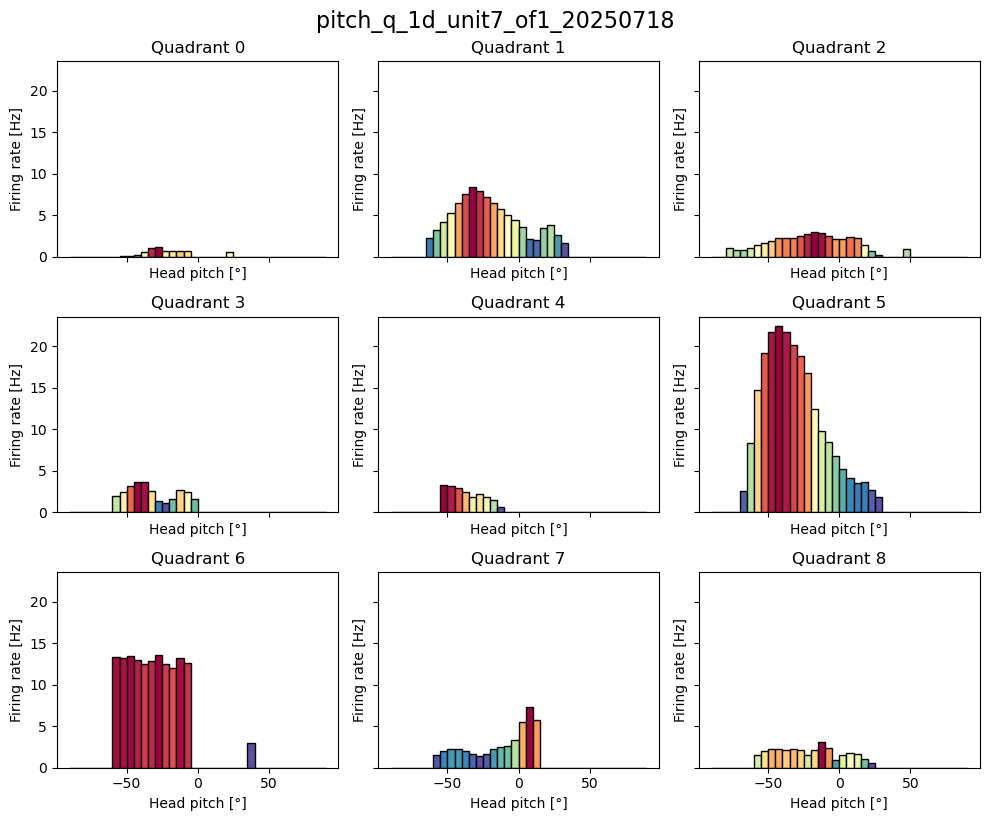

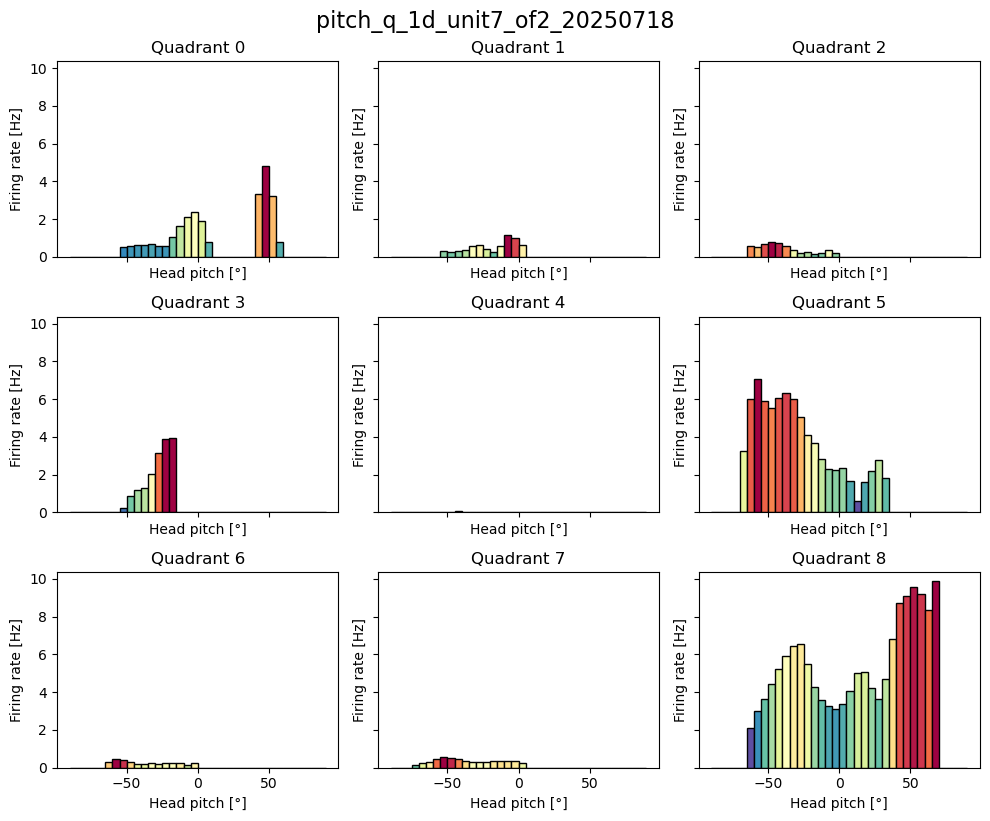

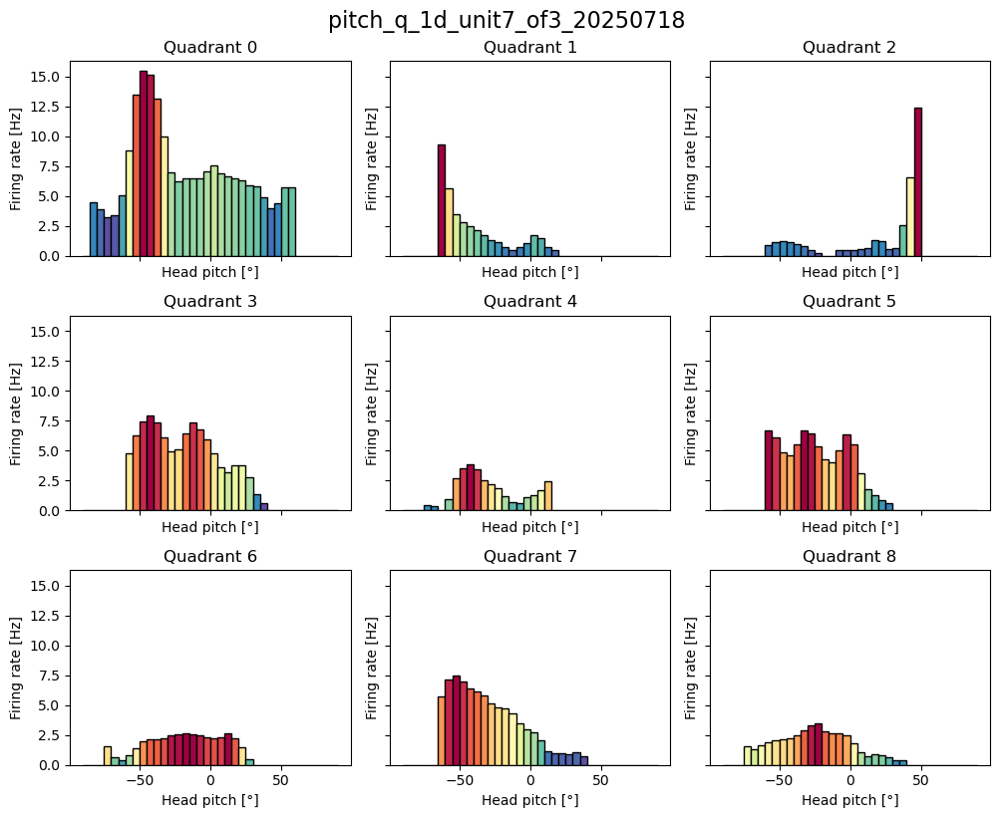

In [31]:
for of in of_keys:
    rm = q_pitch_rate_dict[of]['rm']
    for unit in q_pitch_rate_dict[of]['rm'][0].keys():
        q_behav_plot(unit, rm, save=True)

In [ ]:
X_dict = {} # key1 - of; key2 - unit; arr (binned pitch; quadrant)

for of in of_keys:
    X_dict[of] = {}
    
    for unit in goodspiketimes.keys():
        unit_list = []
        for q in params_dict['quadrant_ids']:
            unit_list.append(rm[q][unit])
        unit_list = np.array(unit_list).T
        X_dict[of][unit] = unit_list


In [35]:
X_dict[of][7].shape

(36, 9)

In [33]:
X_dict

{'of1': {7: array([[        nan,         nan,         nan,         nan,         nan,
                  nan,         nan,         nan,         nan],
         [ 4.46237805,         nan,         nan,         nan,         nan,
                  nan,         nan,         nan,         nan],
         [ 3.94237154,         nan,         nan,         nan,  0.        ,
                  nan,         nan,         nan,         nan],
         [ 3.23671658,         nan,         nan,         nan,  0.43509594,
                  nan,  1.56747333,         nan,  1.57203427],
         [ 3.45378651,         nan,         nan,         nan,  0.37390495,
                  nan,  0.61114687,         nan,  1.2982738 ],
         [ 5.09679551,  9.33786506,         nan,         nan,  0.        ,
                  nan,  0.3699631 ,  5.70554049,  1.61951796],
         [ 8.79763677,  5.64790463,  0.8734727 ,  4.75134228,  0.95756065,
           6.65419167,  0.77208047,  7.13291009,  1.91792961],
         [13.50435232,  

In [34]:
inter

[70, 78, 105, 110, 138, 153, 154, 204, 220, 227, 492, 493]

In [37]:
from NonnegMFPy import nmf

In [44]:
# custom adaptation of nmf with sparsity push

from time import time
from scipy import sparse

_LARGE_NUMBER = 1e100
_SMALL_NUMBER = 1e-5

def _nndsvd(X, n_components, variant="nndsvda", eps=1e-8, random_state=None):
    """
    Nonnegative Double SVD initialization.

    Parameters
    ----------
    X : ndarray of shape (m, n)
        Input nonnegative data matrix.
    n_components : int
        Desired rank of factorization.
    variant : {'nndsvd', 'nndsvda', 'nndsvdar'}
        Initialization flavor.
    eps : float
        Small constant to avoid division by zero.
    random_state : int or None
        Seed for reproducibility.

    Returns
    -------
    W0 : ndarray of shape (m, r)
    H0 : ndarray of shape (r, n)
    """
    rng = np.random.default_rng(random_state)
    m, n = X.shape
    r = n_components

    if r > min(m, n):
        raise ValueError("n_components must be <= min(X.shape).")

    U, S, VT = np.linalg.svd(X, full_matrices=False)
    U, S, VT = U[:, :r], S[:r], VT[:r, :]

    W = np.zeros((m, r), dtype=X.dtype)
    H = np.zeros((r, n), dtype=X.dtype)

    # First component
    up = np.maximum(0, U[:, 0])
    vp = np.maximum(0, VT[0, :])
    W[:, 0] = np.sqrt(S[0]) * (up / (np.linalg.norm(up) or eps))
    H[0, :] = np.sqrt(S[0]) * (vp / (np.linalg.norm(vp) or eps))

    for j in range(1, r):
        u, v = U[:, j], VT[j, :]
        u_p, u_n = np.maximum(0, u), np.maximum(0, -u)
        v_p, v_n = np.maximum(0, v), np.maximum(0, -v)

        alpha = np.linalg.norm(u_p) * np.linalg.norm(v_p)
        beta = np.linalg.norm(u_n) * np.linalg.norm(v_n)

        if alpha >= beta:
            uu = u_p / (np.linalg.norm(u_p) or eps)
            vv = v_p / (np.linalg.norm(v_p) or eps)
            sigma = S[j] * alpha
        else:
            uu = u_n / (np.linalg.norm(u_n) or eps)
            vv = v_n / (np.linalg.norm(v_n) or eps)
            sigma = S[j] * beta

        W[:, j] = np.sqrt(sigma) * uu
        H[j, :] = np.sqrt(sigma) * vv

    if variant.lower() in ("nndsvda", "nndsvdar"):
        avg = X[X > 0].mean() if np.any(X > 0) else eps
        tiny = max(avg * 1e-4, eps)

        if variant.lower() == "nndsvda":
            W[W <= 0] = tiny
            H[H <= 0] = tiny
        else:
            W[W <= 0] = tiny * rng.random(np.count_nonzero(W <= 0))
            H[H <= 0] = tiny * rng.random(np.count_nonzero(H <= 0))

    return np.maximum(W, eps), np.maximum(H, eps)


class YourNMFClass:
    def __init__(self, X, W=None, H=None, V=None, M=None, n_components=5,
                 init="random", random_state=None):
        self.X = np.copy(X)
        self.X[self.X < 0] = 0.0

        self.n_components = n_components
        self.maxiters = 1000
        self.tol = _SMALL_NUMBER

        self.V = np.ones_like(X) if V is None else np.copy(V)
        self.V[self.V < 0] = 0.0

        self.M = np.ones_like(X, dtype=bool) if M is None else np.copy(M)
        if self.M.shape != self.X.shape:
            raise ValueError("Mask shape mismatch.")
        if self.M.dtype != bool:
            raise TypeError("Mask must be boolean.")

        self.V[(self.V * self.M) <= 0] = 0
        self.V_size = np.count_nonzero(self.V)

        if W is not None and H is not None:
            self.W = np.maximum(W, 0.0)
            self.H = np.maximum(H, 0.0)
        elif W is None and H is None:
            if init.lower().startswith("nndsvd"):
                X_eff = np.copy(self.X)
                X_eff[self.V <= 0] = 0.0
                self.W, self.H = _nndsvd(X_eff, self.n_components,
                                         variant=init, random_state=random_state)
            else:
                self.W = np.random.rand(self.X.shape[0], self.n_components)
                self.H = np.random.rand(self.n_components, self.X.shape[1])
        elif W is None:
            self.H = np.maximum(H, 0.0)
            self.W = np.random.rand(self.X.shape[0], self.n_components)
        else:
            self.W = np.maximum(W, 0.0)
            self.H = np.random.rand(self.n_components, self.X.shape[1])

    @property
    def cost(self):
        diff = self.X - self.W @ self.H
        chi2 = np.einsum("ij,ij", self.V * diff, diff) / self.V_size
        return chi2

    def SolveNMF(self, W_only=False, H_only=False, sparsemode=False, maxiters=None, tol=None, debug=False):
        if W_only and H_only:
            print("⚠️ Both W_only and H_only are True — skipping update.")
            return self.cost, 0.0

        if maxiters is not None:
            self.maxiters = maxiters
        if tol is not None:
            self.tol = tol

        chi2 = self.cost
        oldchi2 = _LARGE_NUMBER
        t0 = time()

        if sparsemode:
            V = sparse.csr_matrix(self.V)
            VT = sparse.csr_matrix(self.V.T)
            multiply = sparse.csr_matrix.multiply
            dot = sparse.csr_matrix.dot
        else:
            V = self.V
            VT = self.V.T
            multiply = np.multiply
            dot = np.dot

        XV = multiply(V, self.X)
        XVT = multiply(VT, self.X.T)

        for niter in range(self.maxiters):
            if (oldchi2 - chi2) / oldchi2 <= self.tol:
                break

            if not W_only:
                H_up = dot(XVT, self.W)
                H_down = dot(multiply(VT, (self.W @ self.H).T), self.W)
                self.H *= H_up.T / (H_down.T + 1e-8)

            if not H_only:
                W_up = dot(XV, self.H.T)
                W_down = dot(multiply(V, self.W @ self.H), self.H.T)
                self.W *= W_up / (W_down + 1e-8)

            oldchi2 = chi2
            chi2 = self.cost

            if not np.isfinite(chi2):
                raise ValueError("NMF failed due to NaNs or infs")

            if debug and niter % 20 == 0:
                change = (oldchi2 - chi2) / oldchi2 * 100
                print(f"Iter {niter:3d}: chi2={chi2:.4f}, Δ={change:.4f}%")

        time_used = (time() - t0) / 60.0
        print(f"NMF finished in {time_used:.2f} min")
        return chi2, time_used

In [ ]:
## necessary functions

def cropX(X):
    '''
    matrix X might have nans for all quadrant for extreme pitch values like cclose to +- 90 deg;
    nmf will fale to factorize this matrix cz too many nans;
    better to chop out that empty rows
    '''
    valid_mask = ~np.all(np.isnan(X), axis=1)

    if not np.any(valid_mask):
        print('Matrix is full of NaNs')
        return None, None

    start = np.argmax(valid_mask)
    end = len(valid_mask) - np.argmax(valid_mask[::-1])

    X_cropped = X[start:end]
    crop_indices = (start, end)

    return X_cropped, crop_indices

def minmax(X):
    '''
    non-negative normalization in comparison to z-scoring
    '''
    X_min = np.nanmin(X, axis=0, keepdims=True)
    X_max = np.nanmax(X, axis=0, keepdims=True)
    return (X - X_min) / (X_max - X_min)

def sweep_k(X, k_range=range(1, 10), sparse=False):

    errors = []

    M = ~np.isnan(X)
    V = np.ones_like(X)
    V[(V == 0) & M] = 1e-6
    X_filled = np.nan_to_num(X, nan=0.0)

    if sparse: # use ur custom adaptation of nmf with sparsity feature from scikit learn
        for k in k_range:
            model = YourNMFClass(X_filled, V=V, M=M, n_components=k, init="nndsvd")
            chi2, _ = model.SolveNMF()
            errors.append(chi2)
    else:
        for k in k_range:
            model = nmf.NMF(X_filled, V=V, M=M, n_components=k)
            chi2, _ = model.SolveNMF(sparsemode=True)
            errors.append(chi2)

    return errors

In [45]:
def plot_chi_k(err, of, mode=None, save=False, k_range=range(1, 10)):
    '''
    err - dict with keys - units; arr - list with errors for differtent k
    '''
    plt.figure(figsize=(6,5))
    for u in err.keys():
        try:
            plt.plot(k_range, err[u], marker='o', label=f'unit {u}')
        except Exception as e:
            print(e)
            continue

    plt.xlabel('Number of factors (k)')
    plt.ylabel('Reconstruction error (chi²)')
    plt.legend()
    filename = f'nmf_{mode}_k_selection_{of}_{date}'
    plt.title(filename)
    plt.grid(True)
    if save:
        plt.savefig(nmf_pitch_path/f'{filename}.png', dpi=300, bbox_inches='tight')
    plt.show()            

In [ ]:
pitch_data = {}

for of in of_keys:
    with open(f"{pitch_path}/pf_data_dict1d_{of}_{date}.pkl", "rb") as f:
        pf_data_dict1d = pickle.load(f)
        pitch_data[of] = pf_data_dict1d

In [50]:
# non-normalized calssic version

err = {}
err_sparse = {}

for of in of_keys:
    err[of] = {}
    err_sparse[of] = {}
    
    for unit in inter: # go for interneurons only

        X = X_dict[of][unit]
        print(f'{of} | unit{unit} | X shape:{X.shape}')

        # crop
        X_cropped, crop_indices = cropX(X)
        print(f'{of} | unit{unit} | X_cropped shape:{X_cropped.shape}')

        # normalise
        X_norm = minmax(X_cropped)

        # check how many k u need
        ## normal masked nmf with no normalisation
        err[of][unit] = sweep_k(X_cropped, k_range=range(1, 10), sparse=False)
        ## custom sparse nmf on normalised X
        err_sparse[of][unit] = sweep_k(X_norm, k_range=range(1, 10), sparse=True)


of1 | unit70 | X shape:(36, 9)
of1 | unit70 | X_cropped shape:(29, 9)
Took 0.000 minutes to reach current solution.
Took 0.005 minutes to reach current solution.
Took 0.006 minutes to reach current solution.
Took 0.007 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.006 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.006 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.006 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.007 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.007 minutes to reach current solution.
NMF finished in 0.00 min
NMF finished in 0.00 min
NMF finished in 0.00 min
NMF finished in 0.00 min
NMF finished in 0.00 min
NMF finished in 0.00 min
NMF finished in 0.00 min
NMF finished in 0.00 min
NMF finishe

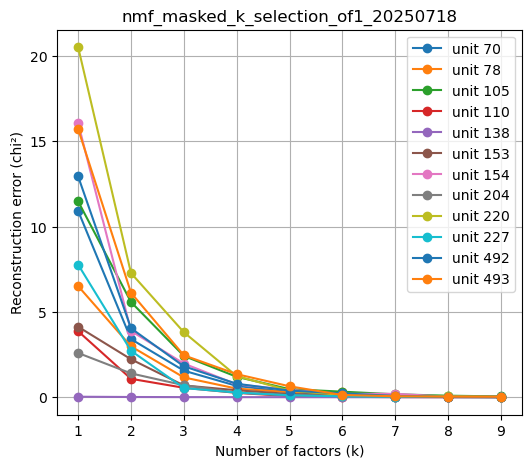

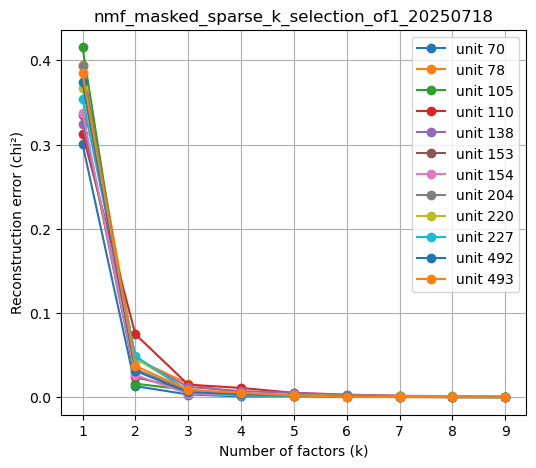

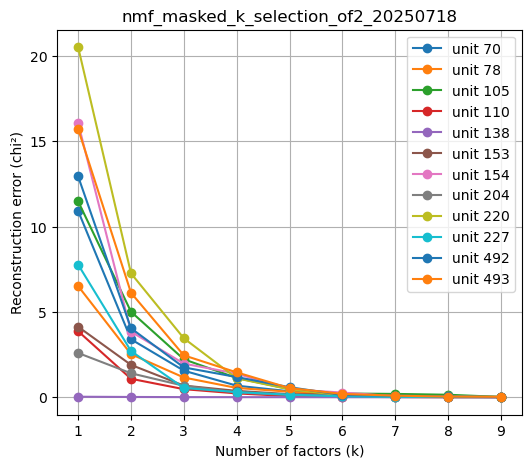

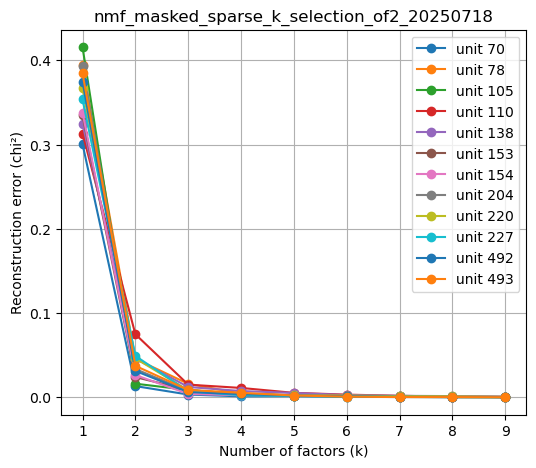

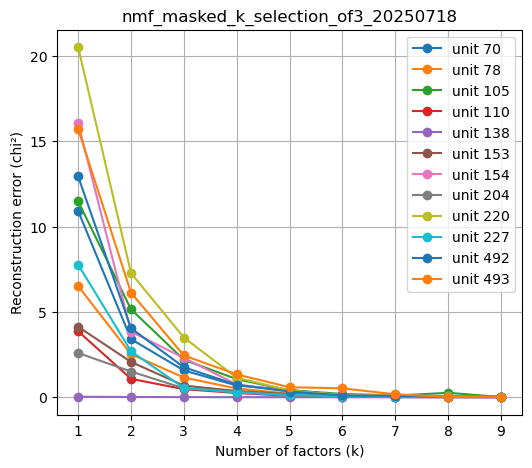

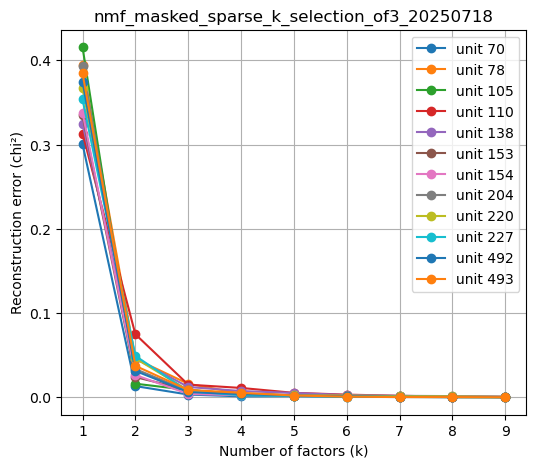

In [51]:
for of in of_keys:
    plot_chi_k(err[of], of=of, mode='masked', save=True, k_range=range(1, 10))
    plot_chi_k(err_sparse[of], of=of, mode='masked_sparse', save=True, k_range=range(1, 10))

In [57]:
X_norm

array([[0.        ,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan],
       [0.01371595,        nan,        nan,        nan, 0.        ,
               nan,        nan,        nan,        nan],
       [0.04164853,        nan,        nan,        nan, 0.07033435,
               nan, 0.        ,        nan, 0.14144299],
       [0.11918197,        nan,        nan,        nan, 0.13678508,
               nan, 0.09493082,        nan, 0.        ],
       [0.25879563, 0.04195286,        nan,        nan, 0.21916693,
               nan, 0.27618412, 0.62308695, 0.13623652],
       [0.49658432, 0.31965701, 0.07920696, 0.6475359 , 0.42900455,
        0.54445635, 0.47337657, 0.73540726, 0.38249428],
       [0.72676178, 0.59011849, 0.27162238, 0.87318109, 0.71748933,
        0.71843613, 0.69921828, 0.88442303, 0.57432385],
       [0.83953657, 0.7224923 , 0.47884761, 0.93325733, 0.8897694 ,
        0.83054112, 0.90773166, 0.97945279, 0.68223875],


In [ ]:
for unit in inter:
    printnmf_hwchi[of][unit]['chi2']

{70: {'chi2': np.float64(1.3371813193502393),
  'W': array([[1.36128127e-01, 2.72020337e-01, 1.40528376e-01, 7.41496510e-01],
         [1.91969663e-01, 2.48879379e-01, 1.65367376e-01, 6.23113747e-01],
         [4.33634254e-01, 2.28613848e-01, 7.62086015e-04, 5.96411072e-01],
         [1.65373994e-01, 2.71227064e-01, 2.87308687e-01, 7.44128575e-01],
         [7.25569971e-01, 1.24794283e-08, 8.07557102e-02, 8.08976848e-01],
         [6.02439018e-01, 2.21825968e-01, 4.30099878e-01, 8.59942301e-01],
         [6.18501494e-01, 3.09601163e-01, 6.08214363e-01, 9.51727267e-01],
         [6.62769231e-01, 3.84986841e-01, 7.04247418e-01, 9.56874101e-01],
         [6.30653388e-01, 4.38045196e-01, 7.78171753e-01, 9.88255907e-01],
         [5.21831045e-01, 4.66165579e-01, 8.80855064e-01, 1.01397349e+00],
         [3.68551222e-01, 4.61277318e-01, 1.05474742e+00, 9.84058806e-01],
         [2.39745717e-01, 4.36390820e-01, 1.32619822e+00, 8.20173503e-01],
         [3.02667405e-01, 4.24841570e-01, 1.51567

In [58]:
k = 4
k_sp = 2

nmf_hwchi = {}
nmf_hwchi_sparse = {}

for of in of_keys:
    nmf_hwchi[of] = {}
    nmf_hwchi_sparse[of] = {}

    for u in inter:
        nmf_hwchi[of][u] = {}
        nmf_hwchi_sparse[of][u] = {}

        X = X_dict[of][unit]
        X_cropped, crop_indices = cropX(X)
        X_norm = minmax(X_cropped) 

        try:
            # classic
            M = ~np.isnan(X_cropped)
            V = np.ones_like(X_cropped)
            V[(V == 0) & M] = 1e-6
            X_filled = np.nan_to_num(X_cropped, nan=0.0)
            model = nmf.NMF(X_filled, V=V, M=M, n_components=k)
            chi2, _ = model.SolveNMF(sparsemode=True)
            nmf_hwchi[of][u]['chi2'] = chi2
            nmf_hwchi[of][u]['W'] = model.W
            nmf_hwchi[of][u]['H'] = model.H

            # sparse
            M = ~np.isnan(X_norm)
            V = np.ones_like(X_norm)
            V[(V == 0) & M] = 1e-6
            X_filled = np.nan_to_num(X_norm, nan=0.0)
            model = YourNMFClass(X_filled, V=V, M=M, n_components=k_sp, init="nndsvd")
            chi2, _ = model.SolveNMF()
            nmf_hwchi_sparse[of][u]['chi2'] = chi2
            nmf_hwchi_sparse[of][u]['W'] = model.W
            nmf_hwchi_sparse[of][u]['H'] = model.H

        except Exception as e:
            print(e)
            continue

Took 0.004 minutes to reach current solution.
NMF finished in 0.00 min
Took 0.006 minutes to reach current solution.
NMF finished in 0.00 min
Iteration in re-initialization reaches maximum number = 1000
Took 0.008 minutes to reach current solution.
NMF finished in 0.00 min
Iteration in re-initialization reaches maximum number = 1000
Took 0.007 minutes to reach current solution.
NMF finished in 0.00 min
Iteration in re-initialization reaches maximum number = 1000
Took 0.007 minutes to reach current solution.
NMF finished in 0.00 min
Iteration in re-initialization reaches maximum number = 1000
Took 0.007 minutes to reach current solution.
NMF finished in 0.00 min
Iteration in re-initialization reaches maximum number = 1000
Took 0.007 minutes to reach current solution.
NMF finished in 0.00 min
Iteration in re-initialization reaches maximum number = 1000
Took 0.007 minutes to reach current solution.
NMF finished in 0.00 min
Iteration in re-initialization reaches maximum number = 1000
Took 

In [ ]:
def plot_nmf_summary(unit, X_dict, nmf_hwchi, sparse=False, cmap='viridis', save=False):
    """
    Visualizes NMF decomposition for 3 sessions: cropped X (or normalized), W, and H matrices.

    Parameters:
        unit : int
            Cell/unit ID
        X_dict : dict
            Condition → unit → matrix
        nmf_hwchi : dict
            Decomposition results: 'W', 'H', 'chi2'
        sparse : bool
            Whether to use normalized input (True) or raw cropped input (False)
        cmap : str
            Colormap
        save : bool
            Save figure or not
    """
    fig, axes = plt.subplots(3, 3, figsize=(10, 10))  # 3 rows, 3 columns

    for i in range(3):
        of = of_keys[i]
        X = X_dict[of][unit]
        X_cropped, crop_indices = cropX(X)
        if X_cropped is None:
            print(f"Skipping {unit} in {of} due to all-NaN rows.")
            continue

        start, end = crop_indices
        X_norm = minmax(X_cropped)

        W = nmf_hwchi[of][unit]['W']
        H = nmf_hwchi[of][unit]['H']
        chi2 = nmf_hwchi[of][unit]['chi2']

        # === Panel 1: Input matrix ===
        ax = axes[i, 0]
        im = ax.imshow(X_norm if sparse else X_cropped, aspect='auto', cmap=cmap)
        ax.set_title(f"{'Norm' if sparse else 'Cropped'} X — {of}")
        ax.set_xlabel("Quadrant")
        ax.set_ylabel("Pitch bin")
        yticks = np.linspace(0, end - start - 1, 5).astype(int)
        ax.set_yticks(yticks)
        ax.set_yticklabels(np.round(pitch_centers[start:end][yticks], 1))
        fig.colorbar(im, ax=ax, shrink=0.7)

        # === Panel 2: W ===
        ax = axes[i, 1]
        im = ax.imshow(W, aspect='auto', cmap=cmap)
        ax.set_title(f"W — {of}")
        ax.set_xlabel("Factor (k)")
        ax.set_ylabel("Pitch bin")
        yticks = np.linspace(0, W.shape[0] - 1, 5).astype(int)
        ax.set_yticks(yticks)
        ax.set_yticklabels(np.round(pitch_centers[start:end][yticks], 1))
        fig.colorbar(im, ax=ax, shrink=0.7)

        # === Panel 3: H ===
        ax = axes[i, 2]
        im = ax.imshow(H, aspect='auto', cmap=cmap)
        ax.set_title(f"H — {of}")
        ax.set_xlabel("Quadrant")
        ax.set_ylabel("Factor (k)")
        ax.set_yticks(np.arange(H.shape[0]))
        ax.set_yticklabels(np.arange(H.shape[0]))
        fig.colorbar(im, ax=ax, shrink=0.7)

    # === Title and save ===
    method = "sparse" if sparse else "classic"
    filename = f"nmf_summary_{method}_unit{unit}_chi2{chi2:.3f}_{date}"
    fig.suptitle(filename, fontsize=14)
    plt.tight_layout()

    if save:
        plt.savefig(nmf_pitch_path / f"{filename}.png", dpi=300, bbox_inches='tight')
    
    plt.show()

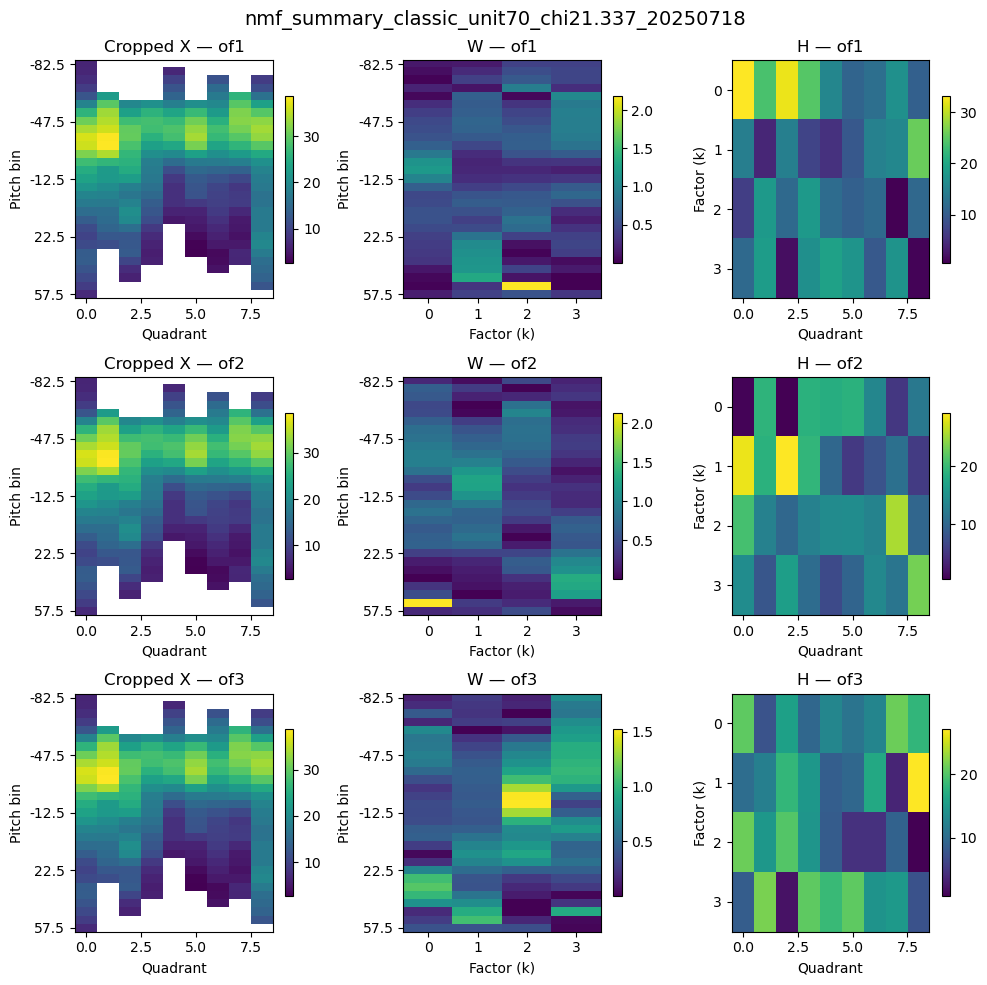

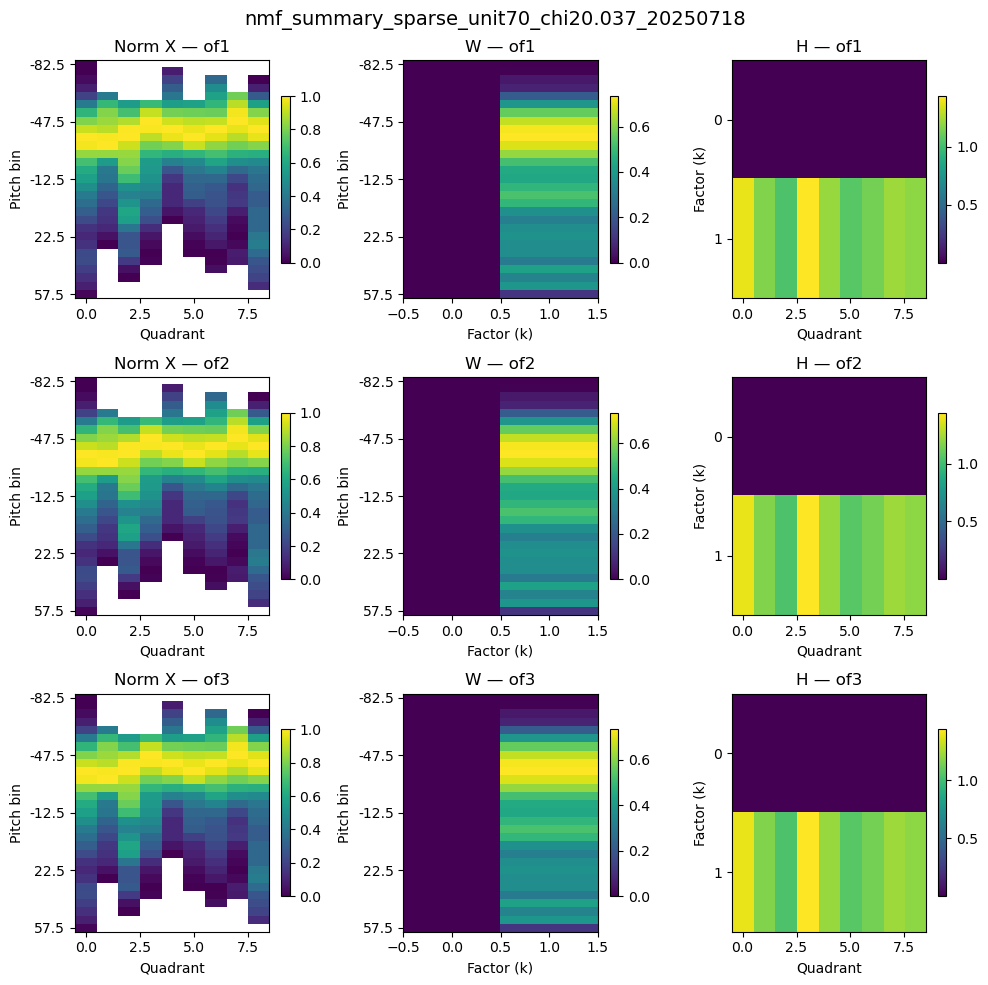

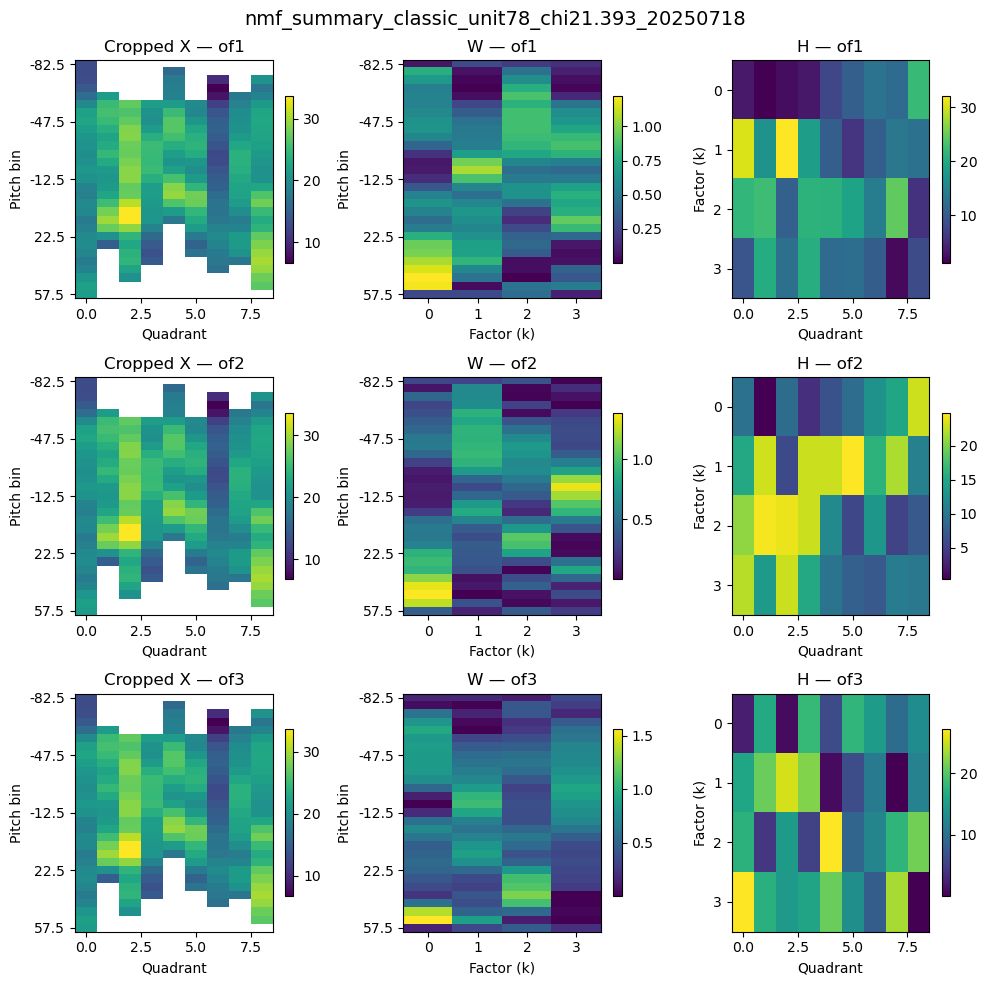

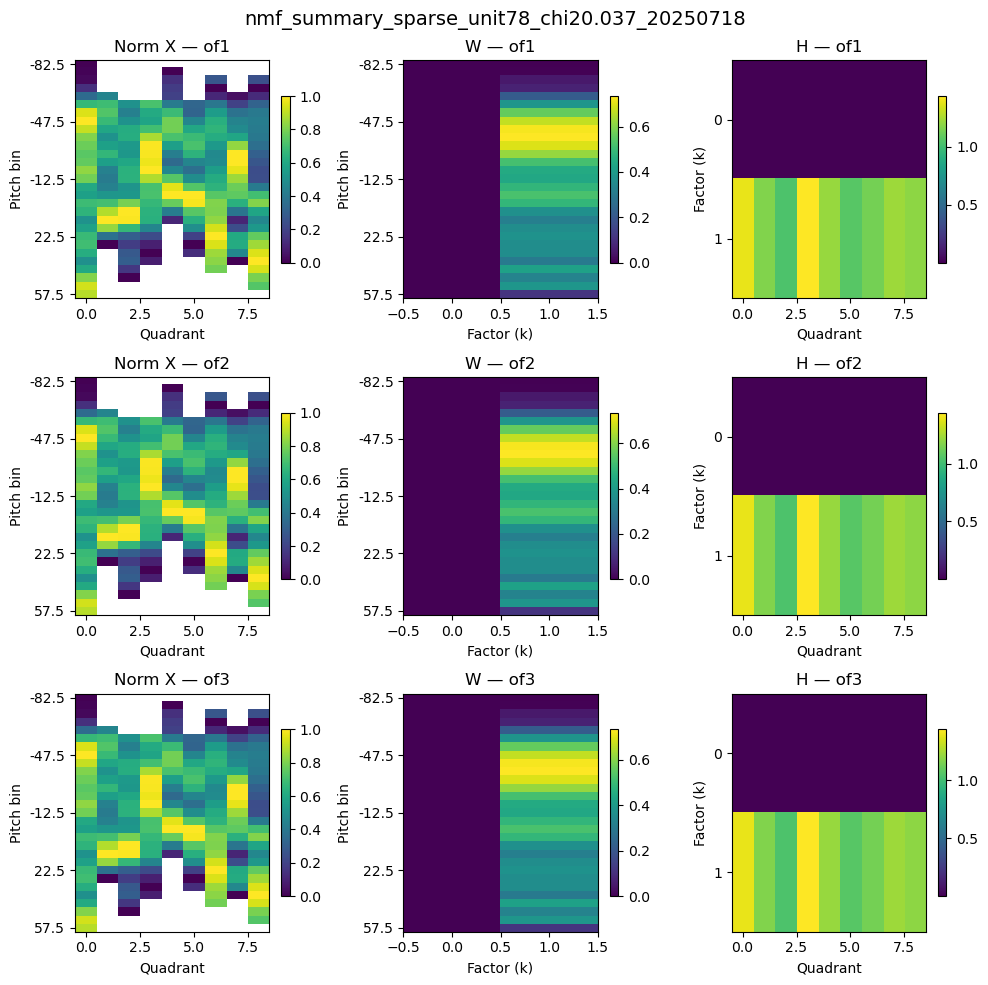

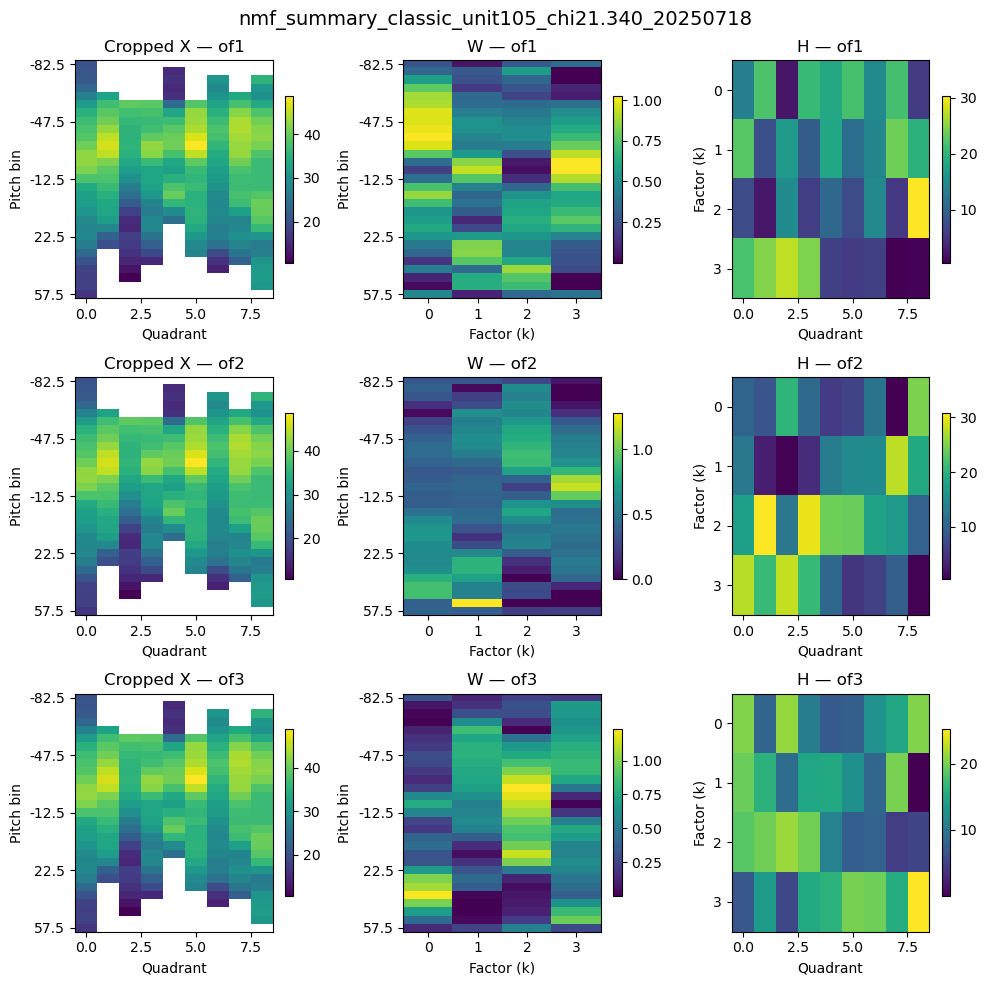

...

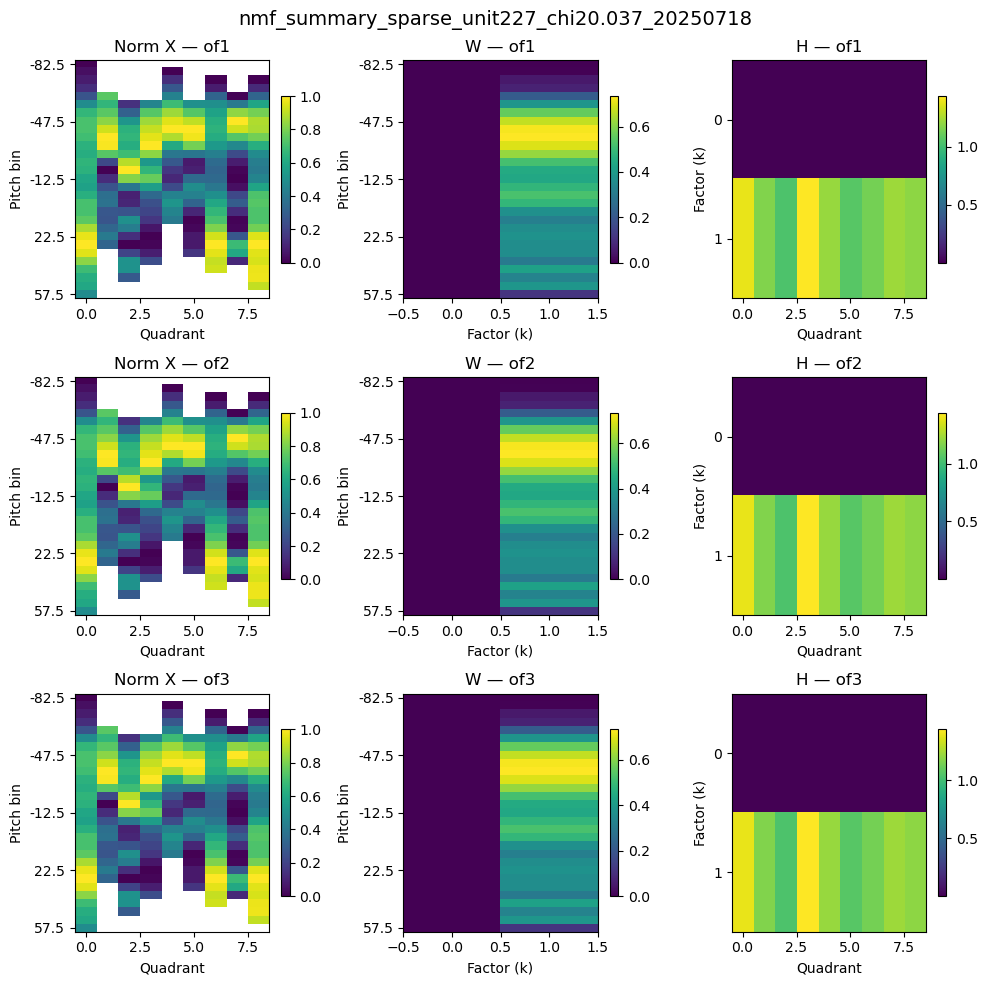

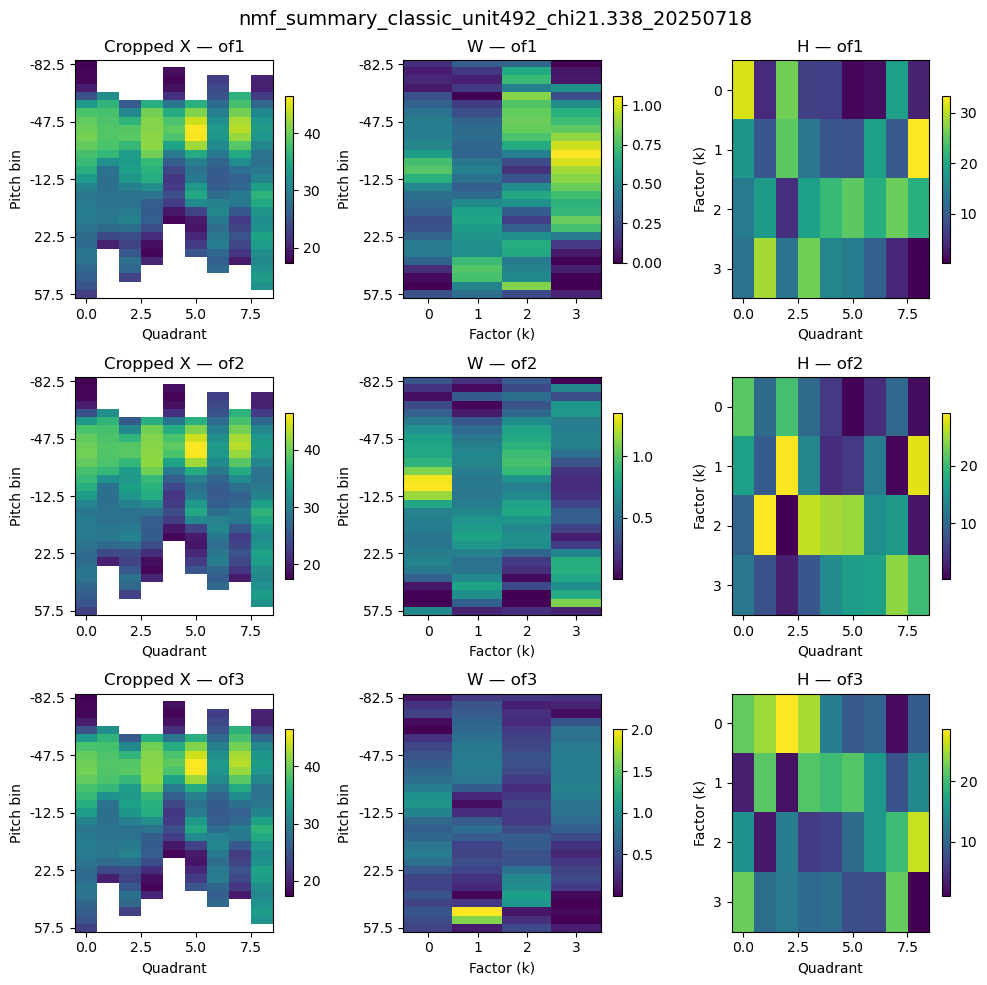

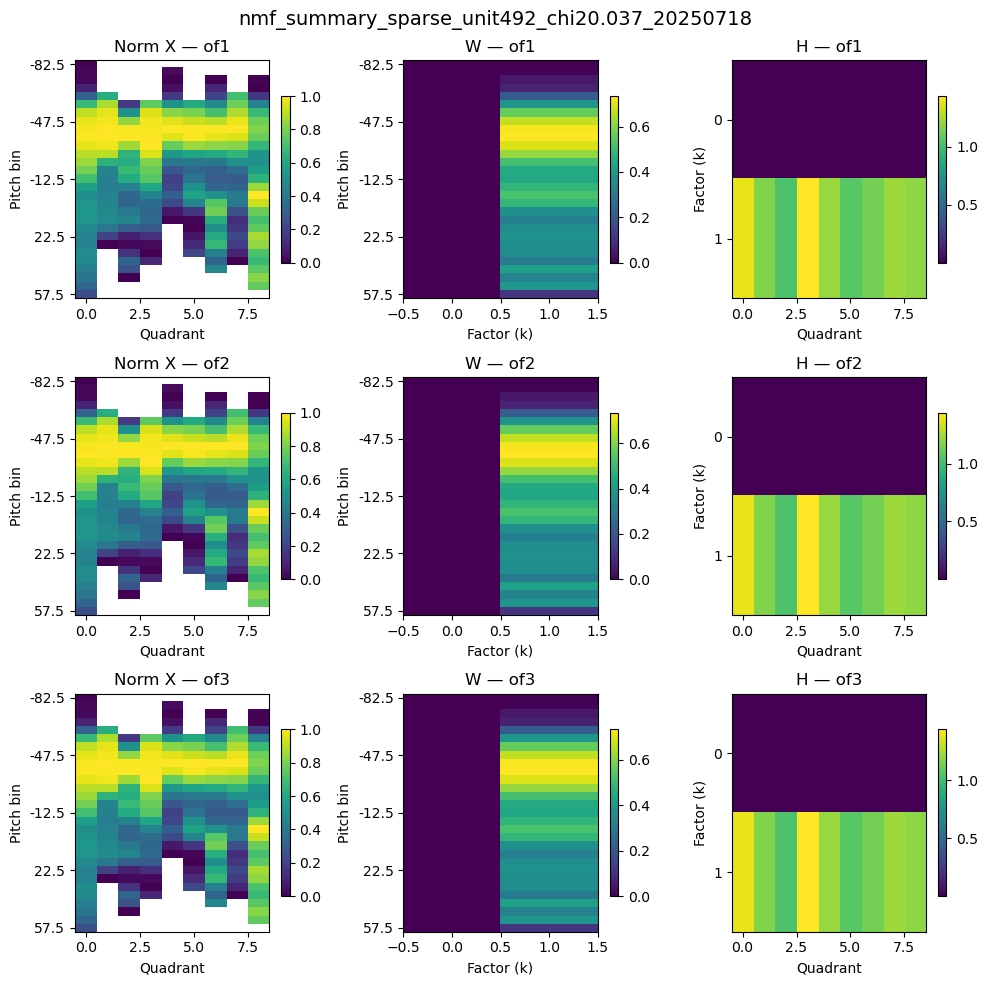

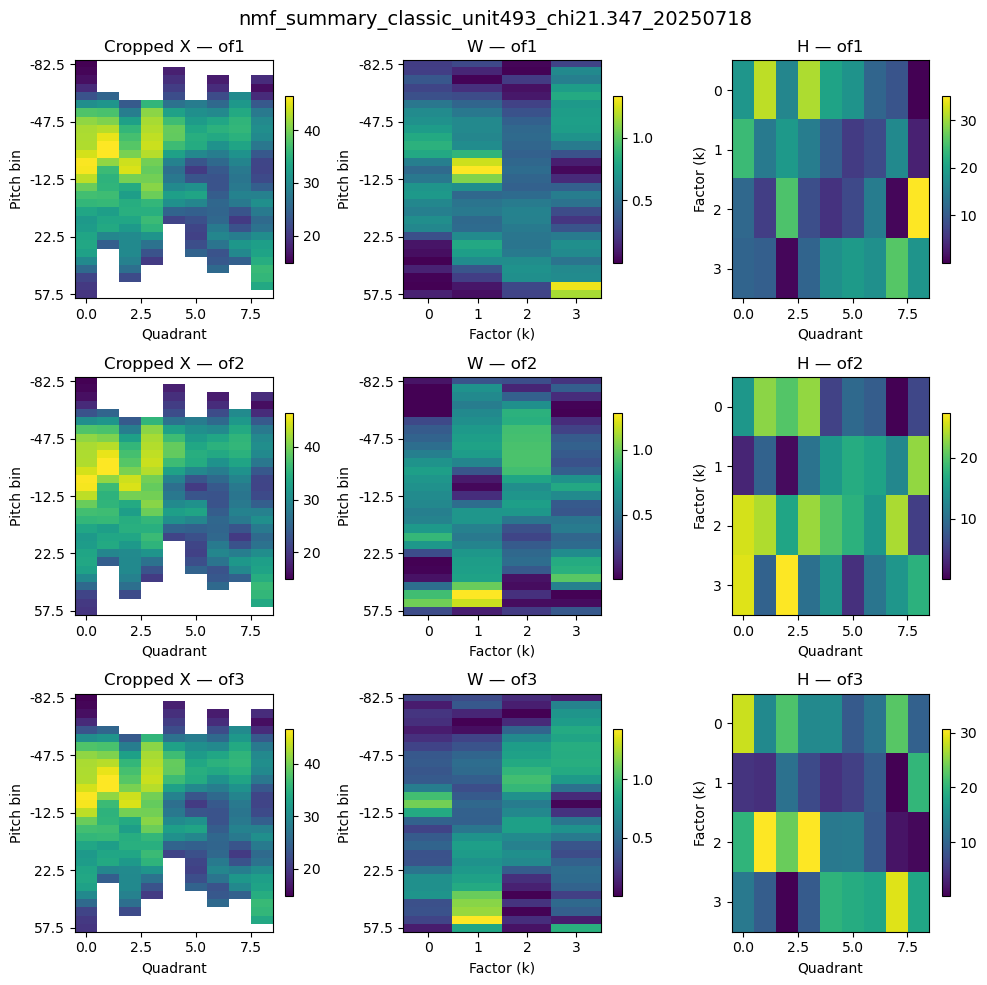

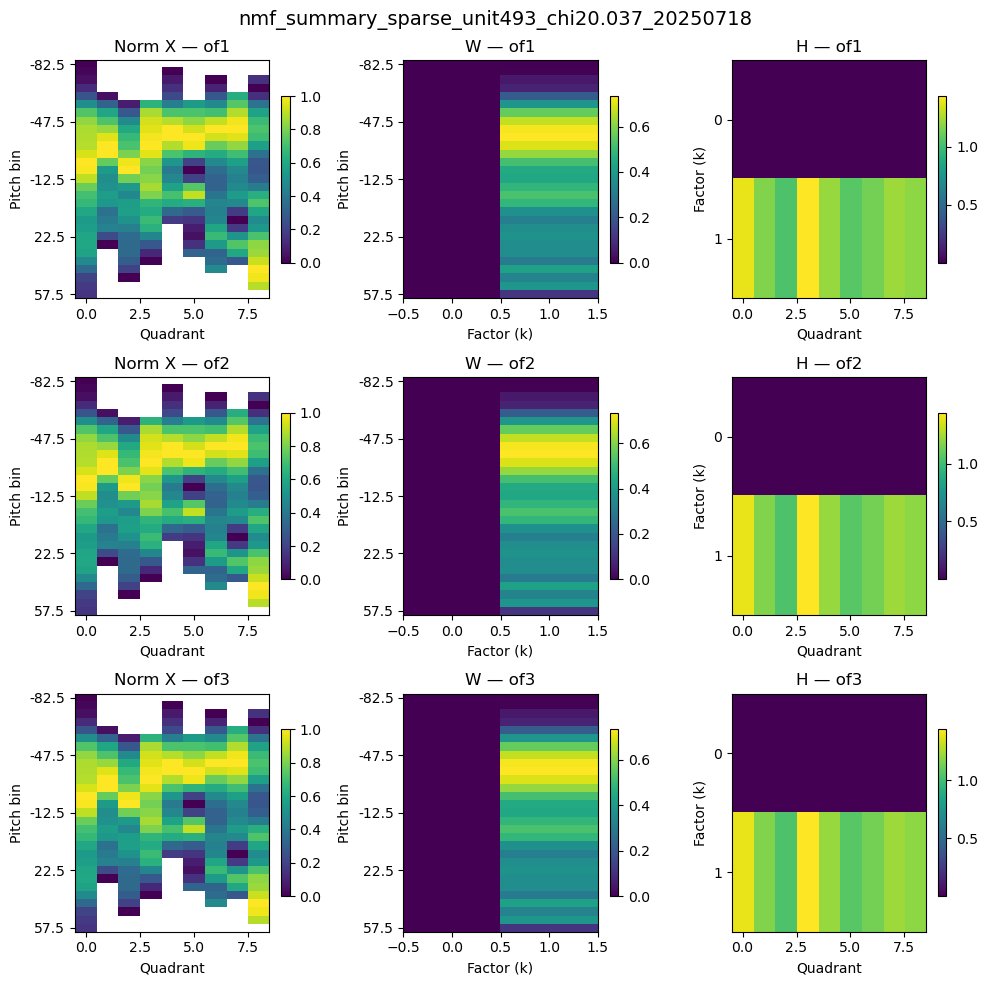

In [63]:
for unit in inter:
    # normal results
    plot_nmf_summary(unit, X_dict, nmf_hwchi, sparse=False, cmap='viridis', save=True)
    # sparse results
    plot_nmf_summary(unit, X_dict, nmf_hwchi_sparse, sparse=True, cmap='viridis', save=True)

In [ ]:
def plot_nmf_summary(unit, X_dict, nmf_hwchi, sparse=False, cmap='viridis', save=False):
    '''
    nmf_hwchi - dont forget to change it if plotting sparse!!
    '''

    fig, axes = plt.subplots(3, 3, figsize=(10, 10))  # 3 rows, 3 columns

    for i in range(3): # row
        of = of_keys[i]

        X = X_dict[of][unit]
        X_cropped, crop_indices = cropX(X)
        X_norm = minmax(X_cropped)
        start, end = crop_indices

        W = nmf_hwchi[of][unit]['W']
        H = nmf_hwchi[of][unit]['H']
        chi2 = nmf_hwchi[of][unit]['chi2']

        if sparse:
            filename = f'nmf_summary_sparse_unit{unit}_chi2{chi2}_{date}'

            j=0 # norm matrix
            ax = axes[i, j]
            im1 = ax.imshow(X_norm, aspect='auto', cmap=cmap)  
            ax.set_title(f"Normalized X {of}")
            ax.set_xlabel("Quadrant")
            ax.set_ylabel("Pitch bin")
            yticks = np.linspace(0, len(pitch_centers[start:end])-1, 5).astype(int)
            ylabels = np.round(pitch_centers[start:end][yticks], 1)
            ax.set_yticks(yticks)
            ax.set_yticklabels(ylabels)
            fig.colorbar(im1, ax=ax, shrink=0.7)

            j=1
            ax = axes[i, j]
            im2 = ax.imshow(W, aspect='auto', cmap=cmap)  
            ax.set_title(f"W {of}")
            ax.set_xlabel("Factor (k)")
            ax.set_ylabel("Pitch bin")
            yticks = np.linspace(0, len(pitch_centers[start:end])-1, 5).astype(int)
            ylabels = np.round(pitch_centers[start:end][yticks], 1)
            ax.set_yticks(yticks)
            ax.set_yticklabels(ylabels)
            fig.colorbar(im2, ax=ax, shrink=0.7)

            j=2
            ax = axes[i, j]
            im3 = ax.imshow(H, aspect='auto', cmap=cmap)  
            ax.set_title(f"H {of}")
            ax.set_xlabel("Quadrant")
            ax.set_ylabel("Factor (k)")
            yticks = np.linspace(0, len(pitch_centers[start:end])-1, 5).astype(int)
            ylabels = np.round(pitch_centers[start:end][yticks], 1)
            ax.set_yticks(np.arange(H.shape[0]))
            ax.set_yticklabels(np.arange(H.shape[0]))
            fig.colorbar(im3, ax=ax, shrink=0.7)

        else:
            filename = f'nmf_summary_classic_unit{unit}_chi2{chi2}_{date}'

            j=0 # norm matrix
            ax = axes[i, j]
            im1 = ax.imshow(X_cropped, aspect='auto', cmap=cmap)  
            ax.set_title(f"Cropped X {of}")
            ax.set_xlabel("Quadrant")
            ax.set_ylabel("Pitch bin")
            yticks = np.linspace(0, len(pitch_centers[start:end])-1, 5).astype(int)
            ylabels = np.round(pitch_centers[start:end][yticks], 1)
            ax.set_yticks(yticks)
            ax.set_yticklabels(ylabels)
            fig.colorbar(im1, ax=ax, shrink=0.7)

            j=1
            ax = axes[i, j]
            im2 = ax.imshow(W, aspect='auto', cmap=cmap)  
            ax.set_title(f"W {of}")
            ax.set_xlabel("Factor (k)")
            ax.set_ylabel("Pitch bin")
            yticks = np.linspace(0, len(pitch_centers[start:end])-1, 5).astype(int)
            ylabels = np.round(pitch_centers[start:end][yticks], 1)
            ax.set_yticks(yticks)
            ax.set_yticklabels(ylabels)
            fig.colorbar(im2, ax=ax, shrink=0.7)

            j=2
            ax = axes[i, j]
            im3 = ax.imshow(H, aspect='auto', cmap=cmap)  
            ax.set_title(f"H {of}")
            ax.set_xlabel("Quadrant")
            ax.set_ylabel("Factor (k)")
            yticks = np.linspace(0, len(pitch_centers[start:end])-1, 5).astype(int)
            ylabels = np.round(pitch_centers[start:end][yticks], 1)
            ax.set_yticks(np.arange(H.shape[0]))
            ax.set_yticklabels(np.arange(H.shape[0]))
            fig.colorbar(im3, ax=ax, shrink=0.7)

    fig.suptitle(filename, fontsize=14)
    plt.tight_layout()

    if save:
        plt.savefig(nmf_pitch_path/f'{filename}.png', dpi=300, bbox_inches='tight')

    plt.show()

In [ ]:
#plotting
def plot_unit_summary(unit, 
                      X_dict, 
                      cropped_matrices, 
                      crop_indices, 
                      pitch_centers, 
                      W_dict, 
                      H_dict, 
                      cmap='viridis'):
    
    X = X_dict[unit]
    X_crop = cropped_matrices[unit]
    W = W_dict[unit]
    H = H_dict[unit]
    start, end = crop_indices[unit]
    
    pitch_full = pitch_centers
    pitch_crop = pitch_centers[start:end]

    fig, axs = plt.subplots(1, 4, figsize=(16, 4), constrained_layout=True)

    # --- 1. Original matrix
    im0 = axs[0].imshow(X, aspect='auto', cmap=cmap)
    axs[0].set_title("Original matrix")
    axs[0].set_xlabel("Quadrant")
    axs[0].set_ylabel("Pitch bin")
    axs[0].set_yticks(np.linspace(0, len(pitch_full)-1, 5).astype(int))
    axs[0].set_yticklabels(np.round(pitch_full[np.linspace(0, len(pitch_full)-1, 5).astype(int)], 1))
    fig.colorbar(im0, ax=axs[0], shrink=0.7)

    # --- 2. Cropped matrix
    im1 = axs[1].imshow(X_crop, aspect='auto', cmap=cmap)
    axs[1].set_title("Cropped matrix")
    axs[1].set_xlabel("Quadrant")
    axs[1].set_yticks(np.linspace(0, len(pitch_crop)-1, 5).astype(int))
    axs[1].set_yticklabels(np.round(pitch_crop[np.linspace(0, len(pitch_crop)-1, 5).astype(int)], 1))
    fig.colorbar(im1, ax=axs[1], shrink=0.7)

    # --- 3. W matrix (pitch × components)
    im2 = axs[2].imshow(W, aspect='auto', cmap=cmap)
    axs[2].set_title("W (Pitch × Components)")
    axs[2].set_xlabel("Component")
    axs[2].set_yticks(np.linspace(0, len(pitch_crop)-1, 5).astype(int))
    axs[2].set_yticklabels(np.round(pitch_crop[np.linspace(0, len(pitch_crop)-1, 5).astype(int)], 1))
    fig.colorbar(im2, ax=axs[2], shrink=0.7)

    # --- 4. H matrix (Components × Quadrants)
    im3 = axs[3].imshow(H, aspect='auto', cmap=cmap)
    axs[3].set_title("H (Components × Quadrants)")
    axs[3].set_xlabel("Quadrant")
    axs[3].set_ylabel("Component")
    axs[3].set_yticks(np.arange(H.shape[0]))  # Clean integer ticks
    axs[3].set_yticklabels(np.arange(H.shape[0]))
    fig.colorbar(im3, ax=axs[3], shrink=0.7)

    fig.suptitle(f"Unit {unit}", fontsize=14)
    plt.show()

In [ ]:
sparse_k = 2

In [ ]:
pitch_centers = pitch_data['of1']['pitch_centers']

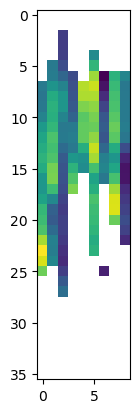

In [23]:
plt.imshow(X)

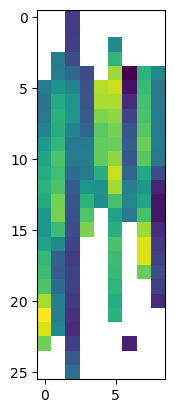

In [24]:
plt.imshow(X[2:28])

In [25]:
X_chop = X[2:28]

In [26]:
np.sum(np.isnan(X))

np.int64(174)

In [27]:
valid_per_col = np.sum(~np.isnan(X), axis=0)
print(valid_per_col)

[19 20 26 12  9 20 12 15 17]


In [28]:
from NonnegMFPy import nmf

In [29]:
# 1. Create a mask: True = valid data, False = missing
M = ~np.isnan(X_chop)

# 2. (Optional) Provide weights: inverse variance (can be ones)
V = np.ones_like(X_chop)  # or better: V = 1 / np.nanvar(X, axis=0)
V[(V == 0) & M] = 1e-6

# 3. Replace NaNs temporarily with zeros (won’t be used due to mask)
X_filled = np.nan_to_num(X_chop, nan=0.0)

In [30]:
X_filled.shape

(26, 9)

In [31]:
a = np.array([[1,2,4,5],[3,4,5,6],[9,9,9,9]])
b = np.array([[1,0,0,0],[0,1,0,0],[0,0,1,0]])
print(f'{np.multiply(a,b)=}\n{np.multiply(a.T,b.T)=}\n{np.multiply(a,b).T=}')

np.multiply(a,b)=array([[1, 0, 0, 0],
       [0, 4, 0, 0],
       [0, 0, 9, 0]])
np.multiply(a.T,b.T)=array([[1, 0, 0],
       [0, 4, 0],
       [0, 0, 9],
       [0, 0, 0]])
np.multiply(a,b).T=array([[1, 0, 0],
       [0, 4, 0],
       [0, 0, 9],
       [0, 0, 0]])


In [32]:
# 4. Instantiate and solve
model = nmf.NMF(X_filled, V=V, M=M, n_components=5)
chi2, time_used = model.SolveNMF()

# 5. Access factors
W = model.W
H = model.H

Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.


In [33]:
W

array([[0.03234089, 0.68077339, 1.21065412, 0.0090273 , 0.56970497],
       [1.30228313, 0.08647224, 0.1800621 , 1.28823365, 0.47595739],
       [0.51542565, 0.60932175, 0.13264468, 0.25180845, 0.68829837],
       [0.61066957, 0.37401615, 0.78483094, 0.43999257, 0.7080857 ],
       [0.96898475, 0.34090279, 0.32900196, 0.45631954, 1.0102646 ],
       [0.95795087, 0.56412258, 0.18524128, 0.50787383, 0.97212616],
       [0.82858415, 0.73041401, 0.11474606, 0.52214466, 1.01964889],
       [0.69930709, 0.81974746, 0.13471888, 0.51770564, 1.01833833],
       [0.5943026 , 0.8292187 , 0.22840043, 0.53493876, 0.98435024],
       [0.53604615, 0.8079338 , 0.3392196 , 0.59353956, 0.96271421],
       [0.57440418, 0.8004601 , 0.45181913, 0.56899209, 0.89876711],
       [0.55366457, 0.84004575, 0.76297537, 0.456092  , 0.60064426],
       [0.36421893, 0.93741928, 1.02866095, 0.48573671, 0.33153828],
       [0.13049105, 1.05978678, 0.96025447, 0.6524768 , 0.31284441],
       [0.05546246, 1.07905247, 0.

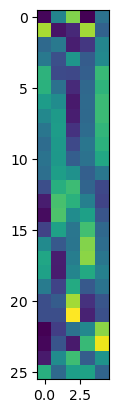

In [34]:
plt.imshow(W)

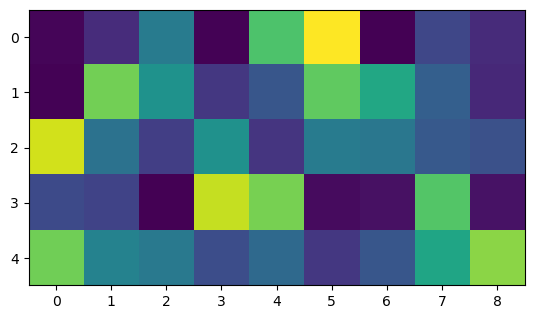

In [35]:
plt.imshow(H)

In [ ]:
def minmax(X):
    X_min = np.nanmin(X, axis=0, keepdims=True)
    X_max = np.nanmax(X, axis=0, keepdims=True)
    return (X - X_min) / (X_max - X_min)

def sweep_k(X_chop, k_range, M=None, V=None, verbose=False):
    errors = []

    M = ~np.isnan(X_chop)
    V = np.ones_like(X_chop)
    V[(V == 0) & M] = 1e-6
    print('RE')
    XX = minmax(X_chop)
    X_filled = np.nan_to_num(XX, nan=0.0)

    for k in k_range:
        model = nmf.NMF(X_filled, V=V, M=M, n_components=k )
        chi2, _ = model.SolveNMF(sparsemode=True)
        errors.append(chi2)

    return errors

RE
Took 0.001 minutes to reach current solution.


Took 0.002 minutes to reach current solution.
Took 0.002 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.007 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.008 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.008 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.008 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.008 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.008 minutes to reach current solution.


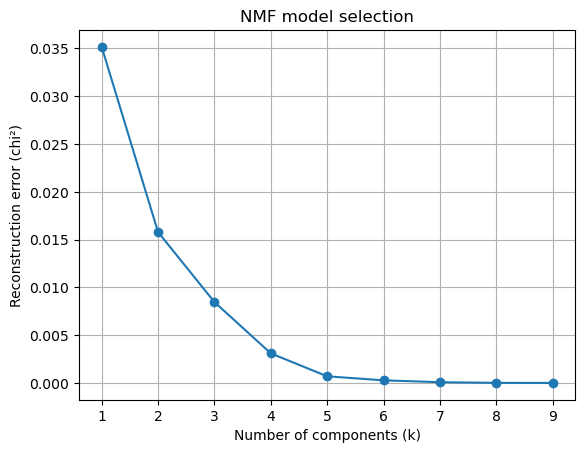

In [74]:
k_values = range(1, 10)
errors = sweep_k(X_chop, k_values)

plt.plot(k_values, errors, marker='o')
plt.xlabel('Number of components (k)')
plt.ylabel('Reconstruction error (chi²)')
plt.title('NMF model selection')
plt.grid(True)
plt.show()

Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.


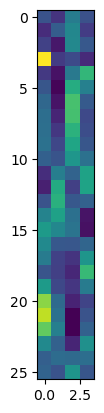

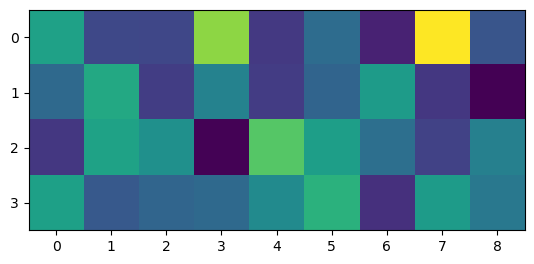

In [41]:
k=4
M = ~np.isnan(X_chop)
V = np.ones_like(X_chop)
V[(V == 0) & M] = 1e-6
X_filled = np.nan_to_num(X_chop, nan=0.0)
model = nmf.NMF(X_filled, V=V, M=M, n_components=k)
chi2, _ = model.SolveNMF()
W = model.W
H = model.H

plt.figure()
plt.imshow(W)
plt.show()

plt.figure()
plt.imshow(H)
plt.show()

z score? --> better minmax cz negative values we dont want

In [42]:
def minmax(X):
    X_min = np.nanmin(X, axis=0, keepdims=True)
    X_max = np.nanmax(X, axis=0, keepdims=True)
    return (X - X_min) / (X_max - X_min)

Took 0.002 minutes to reach current solution.


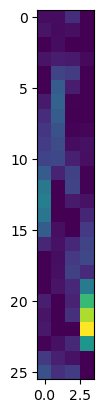

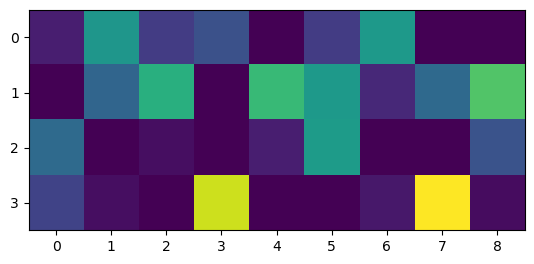

In [43]:
k=4
Xn = minmax(X_chop)
M = ~np.isnan(Xn)
V = np.ones_like(Xn)
V[(V == 0) & M] = 1e-6
X_filled = np.nan_to_num(Xn, nan=0.0)
model = nmf.NMF(X_filled, V=V, M=M, n_components=k)
chi2, _ = model.SolveNMF()
W = model.W
H = model.H

plt.figure()
plt.imshow(W)
plt.show()

plt.figure()
plt.imshow(H)
plt.show()

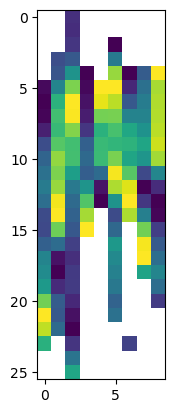

In [44]:
plt.imshow(Xn)

RE
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.001 minutes to reach current solution.
Took 0.001 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.


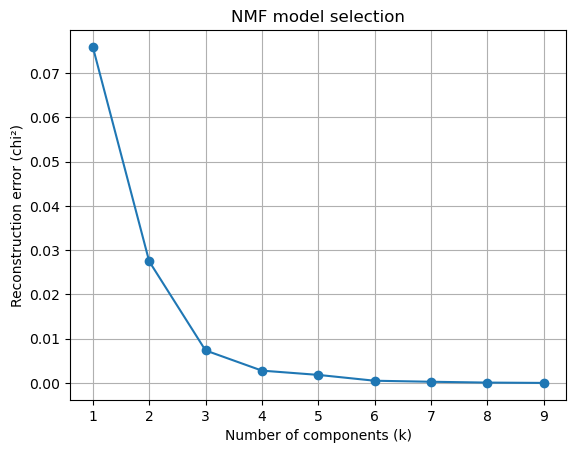

In [45]:
k_values = range(1, 10)
# Xn = minmax(X_chop)
errors = sweep_k(Xn, k_values)
plt.plot(k_values, errors, marker='o')
plt.xlabel('Number of components (k)')
plt.ylabel('Reconstruction error (chi²)')
plt.title('NMF model selection')
plt.grid(True)
plt.show()

In [62]:
# chop matrices first

cropped_matrices = {}
crop_indices = {}

for u in spikes_resampled.keys():
    X = X_dict[u]
    # Find valid rows (not all NaN)
    valid_mask = ~np.all(np.isnan(X), axis=1)

    if not np.any(valid_mask):
        # All rows are NaN → skip or handle differently
        cropped_matrices[u] = None
        crop_indices[u] = (None, None)
        continue

    start = np.argmax(valid_mask)
    end = len(valid_mask) - np.argmax(valid_mask[::-1])

    cropped = X[start:end]
    cropped_matrices[u] = cropped
    crop_indices[u] = (start, end)

In [ ]:
pitch_centers

array([-87.5, -82.5, -77.5, -72.5, -67.5, -62.5, -57.5, -52.5, -47.5,
       -42.5, -37.5, -32.5, -27.5, -22.5, -17.5, -12.5,  -7.5,  -2.5,
         2.5,   7.5,  12.5,  17.5,  22.5,  27.5,  32.5,  37.5,  42.5,
        47.5,  52.5,  57.5,  62.5,  67.5,  72.5,  77.5,  82.5,  87.5])

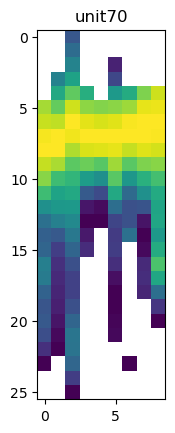

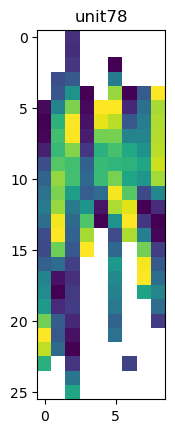

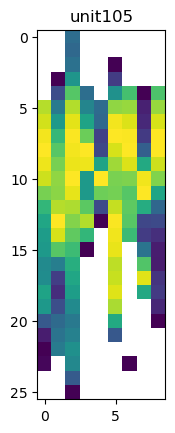

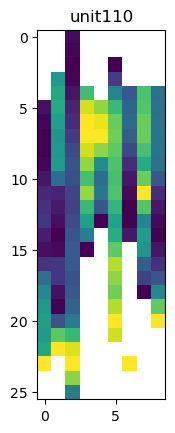

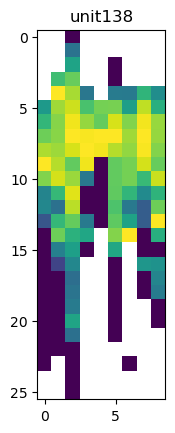

...

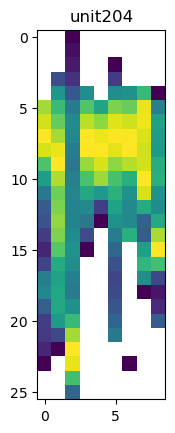

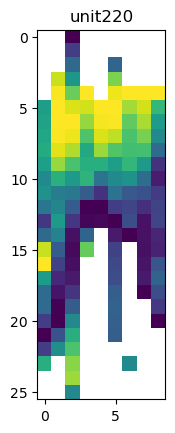

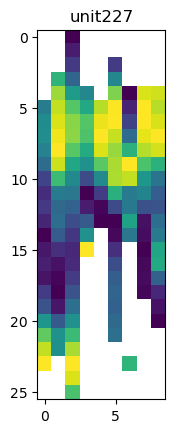

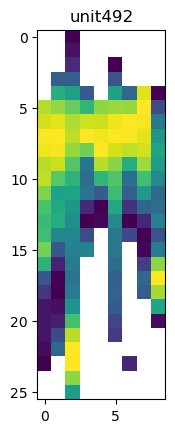

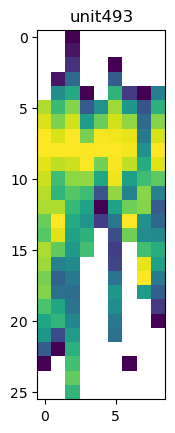

In [64]:
for u in inter:
    X_chop = cropped_matrices[u]
    X_chop = safe_minmax(X_chop)
    plt.figure()
    plt.imshow(X_chop)
    plt.title(f'unit{u}')
    plt.show()

In [65]:
from NonnegMFPy import nmf
u = 493
X_chop = cropped_matrices[u]
X_chop = minmax(X_chop)
M = ~np.isnan(X_chop)
V = np.ones_like(X_chop)
V[(V == 0) & M] = 1e-6
X_filled = np.nan_to_num(X_chop, nan=0.0)
model = nmf.NMF(X_filled, V=V, M=M, n_components=2)
chi2, time_used = model.SolveNMF()

Took 0.001 minutes to reach current solution.


In [50]:
X_chop

array([[        nan,         nan, 14.37367041,         nan,         nan,
                nan,         nan,         nan,         nan],
       [        nan,         nan, 14.32333497,         nan,         nan,
                nan,         nan,         nan,         nan],
       [        nan,         nan, 14.52424087,         nan,         nan,
        20.11667304,         nan,         nan,         nan],
       [        nan, 18.80734545, 15.44963145,         nan,         nan,
        23.59236858,         nan,         nan,         nan],
       [        nan, 19.01583754, 17.27241686, 15.3978323 ,         nan,
        27.32423812, 10.89804965, 23.35408275, 19.62588855],
       [18.7540119 , 20.86651254, 19.52542162, 15.6435072 , 28.04257285,
        28.63688021, 11.87187087, 23.98820478, 18.62748015],
       [18.47063574, 22.75881711, 21.04860077, 15.91769147, 27.75249006,
        27.76115051, 13.32706268, 24.40489569, 18.71280006],
       [18.6255364 , 23.3095622 , 20.99397041, 16.26846296, 26

In [51]:
inter

[70, 78, 105, 110, 138, 153, 154, 204, 220, 227, 492, 493]

In [66]:
u=78
xx = minmax(cropped_matrices[u])

In [67]:
xx

array([[       nan,        nan, 0.13907899,        nan,        nan,
               nan,        nan,        nan,        nan],
       [       nan,        nan, 0.13258681,        nan,        nan,
               nan,        nan,        nan,        nan],
       [       nan,        nan, 0.1584993 ,        nan,        nan,
        0.        ,        nan,        nan,        nan],
       [       nan, 0.24144606, 0.27785459,        nan,        nan,
        0.40793557,        nan,        nan,        nan],
       [       nan, 0.26259987, 0.51295431, 0.        ,        nan,
        0.84593777, 0.        , 0.29069983, 1.        ],
       [0.02424475, 0.45037121, 0.80354298, 0.02248043, 1.        ,
        1.        , 0.11064098, 0.36820876, 0.87079547],
       [0.        , 0.64236632, 1.        , 0.04756961, 0.96283047,
        0.89721732, 0.27597303, 0.41914102, 0.88183676],
       [0.0132528 , 0.69824547, 0.99295387, 0.07966689, 0.79286756,
        0.7950541 , 0.44636154, 0.44901882, 0.88658801],


In [75]:
k_range = range(1, 10)
chik_dict = {}

for u in inter:
    X_chop=cropped_matrices[u]
    try:
        chik_dict[u] = sweep_k(X_chop, k_range, M, V)
    except:
        chik_dict[u] = None
        print(f'failed to process unit {u}')

RE
Took 0.000 minutes to reach current solution.
Took 0.007 minutes to reach current solution.
Took 0.006 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.007 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.008 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.008 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.008 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.008 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.008 minutes to reach current solution.
RE
Took 0.000 minutes to reach current solution.
Took 0.001 minutes to reach current solution.
Took 0.002 minutes to reach current solution.
Took 0.007 minutes to reach current solution.
Iteration in re-initialization

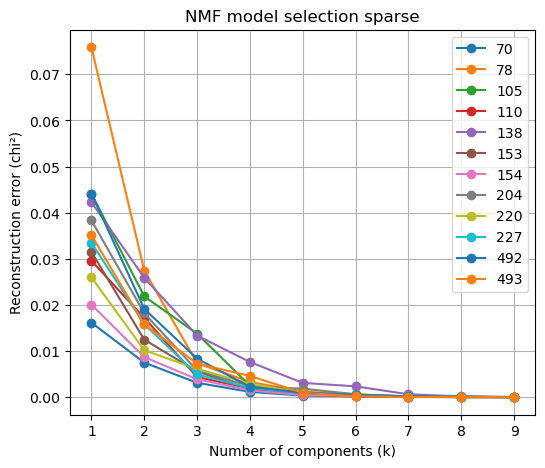

In [76]:
plt.figure(figsize=(6,5))
for u in chik_dict.keys():
    try:
        plt.plot(k_range, chik_dict[u], marker='o', label=u)
    except:
        continue
plt.xlabel('Number of components (k)')
plt.ylabel('Reconstruction error (chi²)')
plt.legend()
plt.title('NMF model selection sparse')
plt.grid(True)
plt.show()

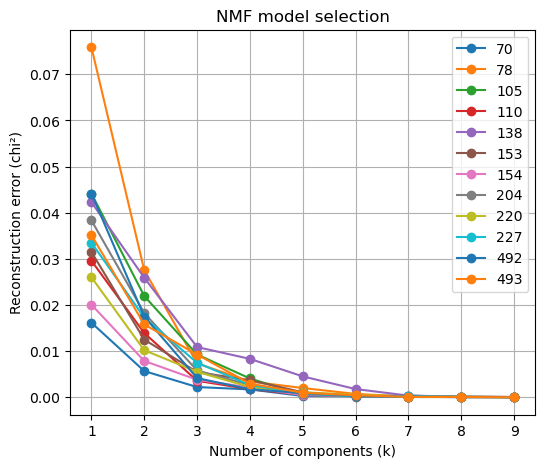

In [69]:
plt.figure(figsize=(6,5))
for u in chik_dict.keys():
    try:
        plt.plot(k_range, chik_dict[u], marker='o', label=u)
    except:
        continue
plt.xlabel('Number of components (k)')
plt.ylabel('Reconstruction error (chi²)')
plt.legend()
plt.title('NMF model selection')
plt.grid(True)
plt.show()

In [116]:
k=2
W_dict = {}
H_dict = {}
for u in inter:
    try:
        X_chop = cropped_matrices[u]
        XX = minmax(X_chop) #minmax(X_chop)
        M = ~np.isnan(XX)
        V = np.ones_like(XX)
        V[(V == 0) & M] = 1e-6
        X_filled = np.nan_to_num(XX, nan=0.0)
        model = nmf.NMF(X_filled, V=V, M=M, n_components=k)
        chi2, time_used = model.SolveNMF()
        W_dict[u] = model.W
        H_dict[u] = model.H
    except:
        continue

Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.


Took 0.001 minutes to reach current solution.
Took 0.001 minutes to reach current solution.
Took 0.001 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.001 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.


In [117]:
#plotting
def plot_unit_summary(unit, 
                      X_dict, 
                      cropped_matrices, 
                      crop_indices, 
                      pitch_centers, 
                      W_dict, 
                      H_dict, 
                      cmap='viridis'):
    
    X = X_dict[unit]
    X_crop = cropped_matrices[unit]
    W = W_dict[unit]
    H = H_dict[unit]
    start, end = crop_indices[unit]
    
    pitch_full = pitch_centers
    pitch_crop = pitch_centers[start:end]

    fig, axs = plt.subplots(1, 4, figsize=(16, 4), constrained_layout=True)

    # --- 1. Original matrix
    im0 = axs[0].imshow(X, aspect='auto', cmap=cmap)
    axs[0].set_title("Original matrix")
    axs[0].set_xlabel("Quadrant")
    axs[0].set_ylabel("Pitch bin")
    axs[0].set_yticks(np.linspace(0, len(pitch_full)-1, 5).astype(int))
    axs[0].set_yticklabels(np.round(pitch_full[np.linspace(0, len(pitch_full)-1, 5).astype(int)], 1))
    fig.colorbar(im0, ax=axs[0], shrink=0.7)

    # --- 2. Cropped matrix
    im1 = axs[1].imshow(X_crop, aspect='auto', cmap=cmap)
    axs[1].set_title("Cropped matrix")
    axs[1].set_xlabel("Quadrant")
    axs[1].set_yticks(np.linspace(0, len(pitch_crop)-1, 5).astype(int))
    axs[1].set_yticklabels(np.round(pitch_crop[np.linspace(0, len(pitch_crop)-1, 5).astype(int)], 1))
    fig.colorbar(im1, ax=axs[1], shrink=0.7)

    # --- 3. W matrix (pitch × components)
    im2 = axs[2].imshow(W, aspect='auto', cmap=cmap)
    axs[2].set_title("W (Pitch × Components)")
    axs[2].set_xlabel("Component")
    axs[2].set_yticks(np.linspace(0, len(pitch_crop)-1, 5).astype(int))
    axs[2].set_yticklabels(np.round(pitch_crop[np.linspace(0, len(pitch_crop)-1, 5).astype(int)], 1))
    fig.colorbar(im2, ax=axs[2], shrink=0.7)

    # --- 4. H matrix (Components × Quadrants)
    im3 = axs[3].imshow(H, aspect='auto', cmap=cmap)
    axs[3].set_title("H (Components × Quadrants)")
    axs[3].set_xlabel("Quadrant")
    axs[3].set_ylabel("Component")
    axs[3].set_yticks(np.arange(H.shape[0]))  # Clean integer ticks
    axs[3].set_yticklabels(np.arange(H.shape[0]))
    fig.colorbar(im3, ax=axs[3], shrink=0.7)

    fig.suptitle(f"Unit {unit}", fontsize=14)
    plt.show()

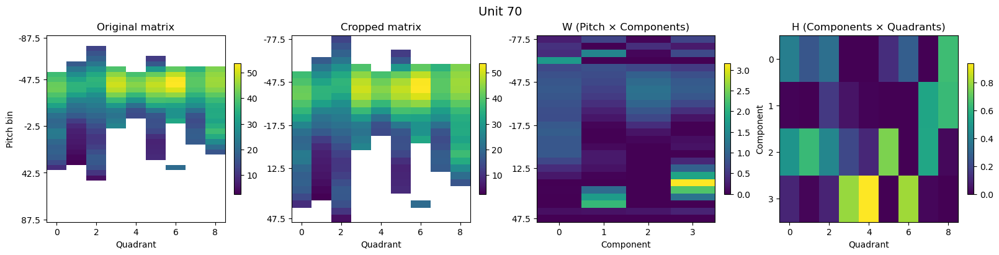

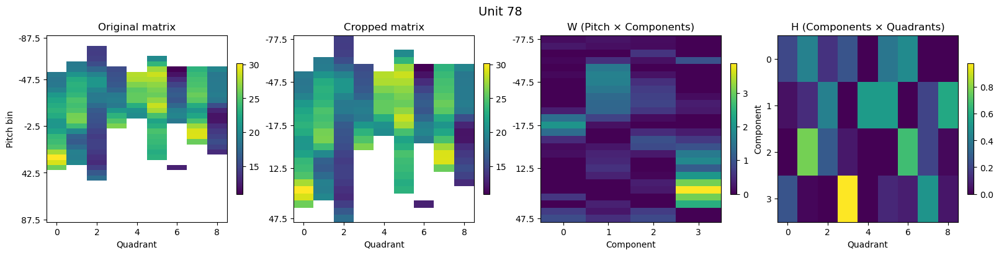

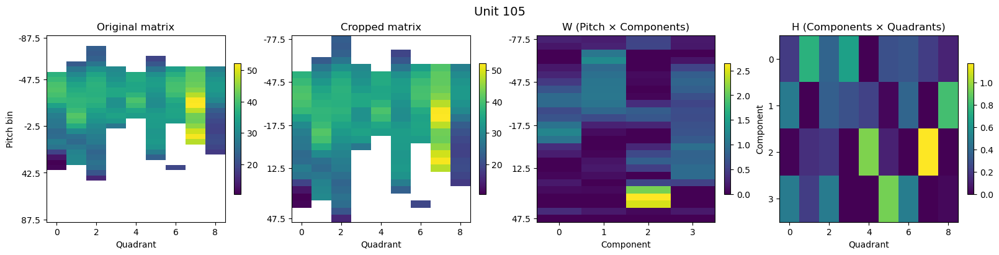

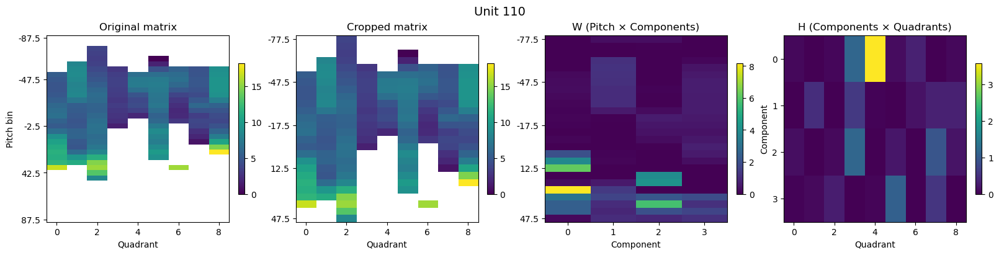

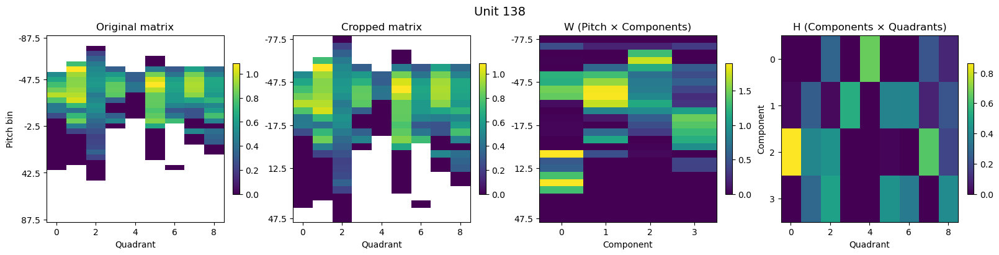

...

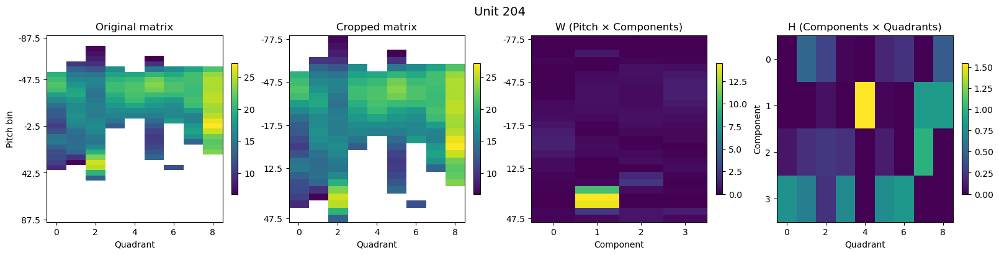

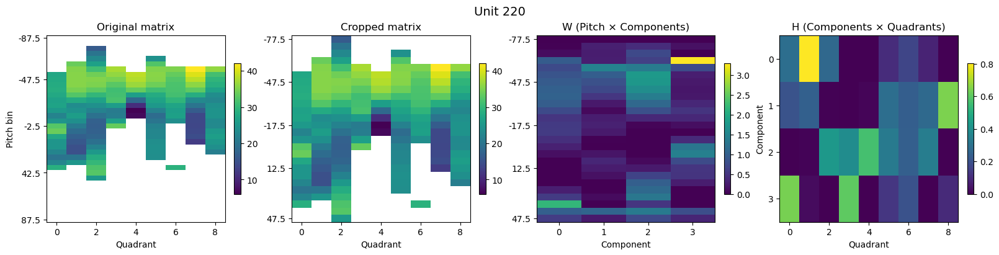

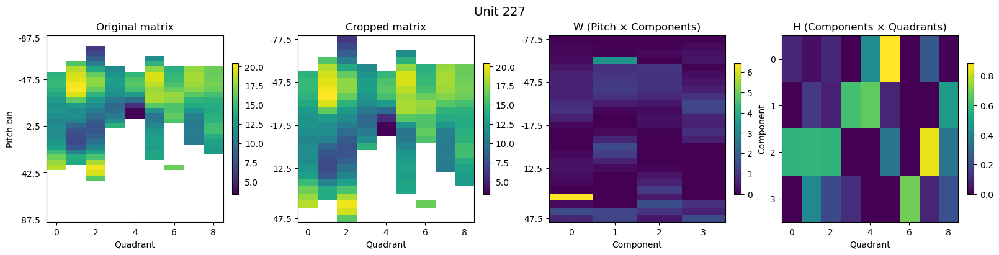

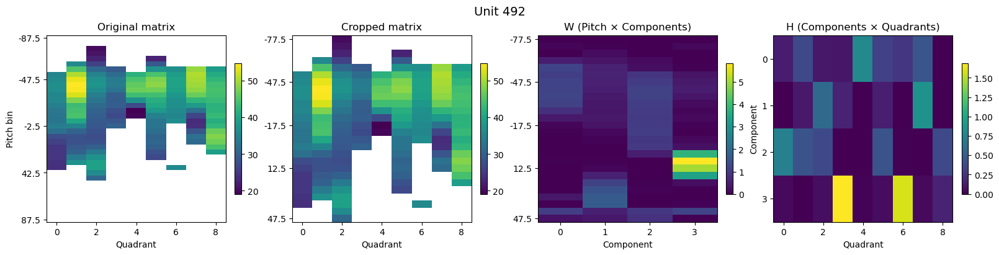

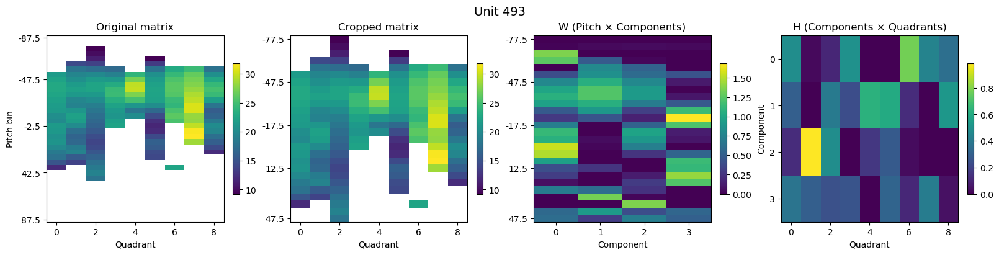

In [80]:
for unit in X_dict.keys():
    try:
        plot_unit_summary(unit, X_dict, cropped_matrices, crop_indices, pitch_centers, W_dict, H_dict)
    except:
        continue

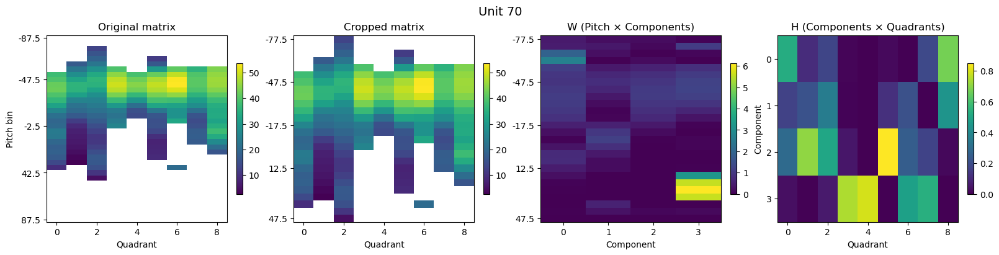

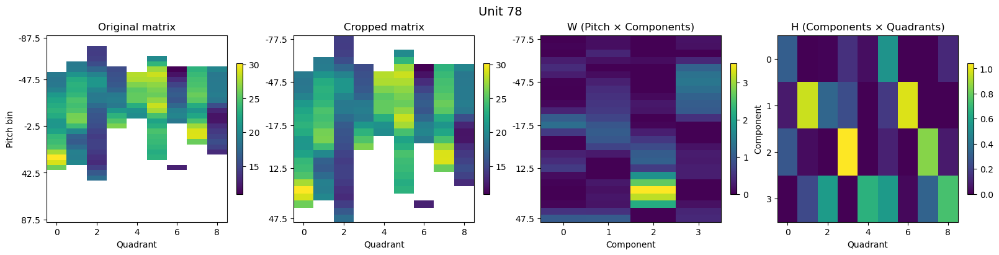

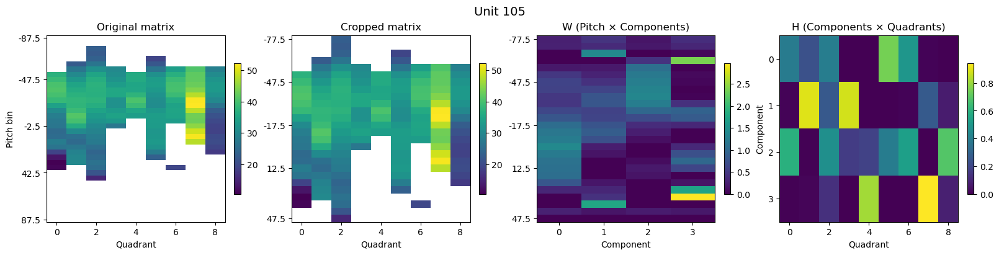

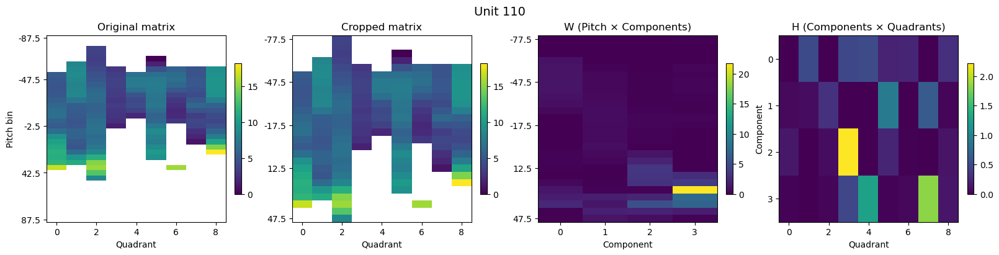

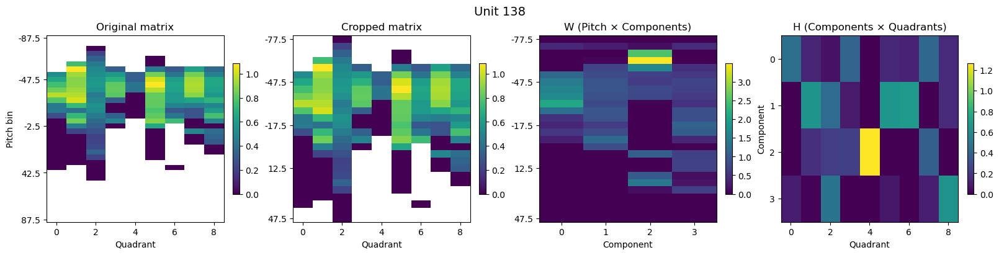

...

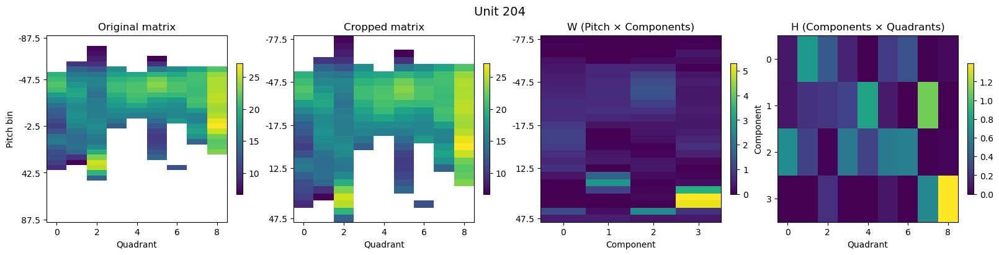

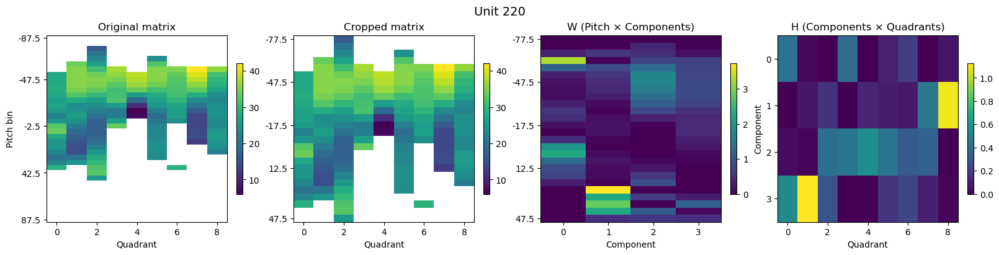

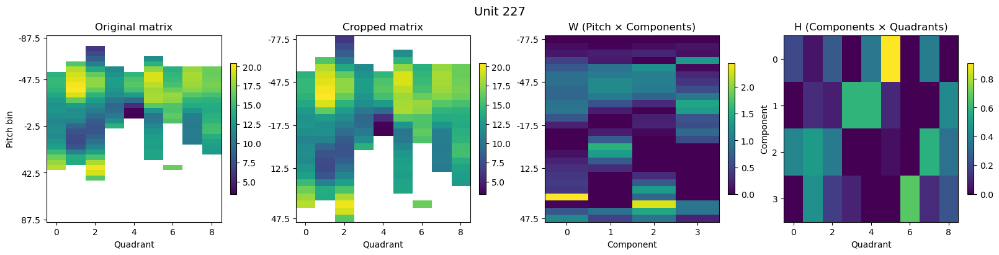

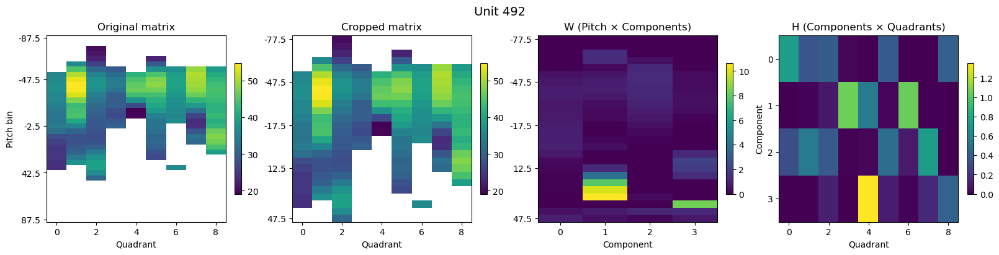

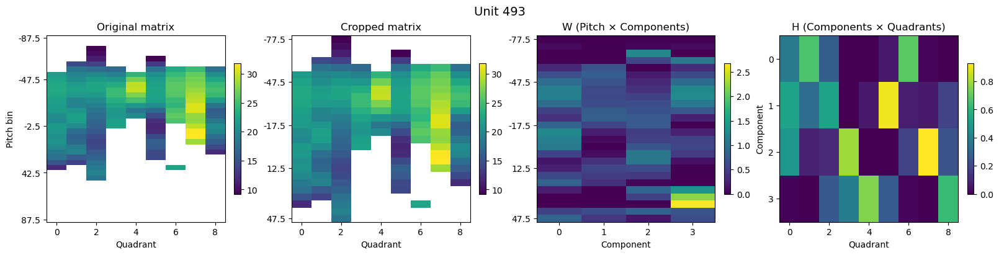

In [82]:
for unit in X_dict.keys():
    try:
        plot_unit_summary(unit, X_dict, cropped_matrices, crop_indices, pitch_centers, W_dict, H_dict)
    except:
        continue

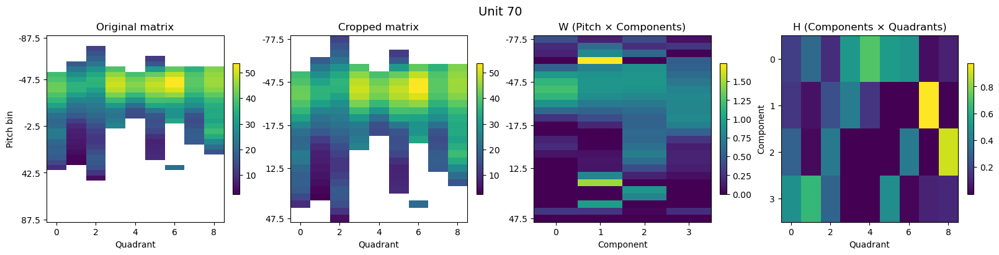

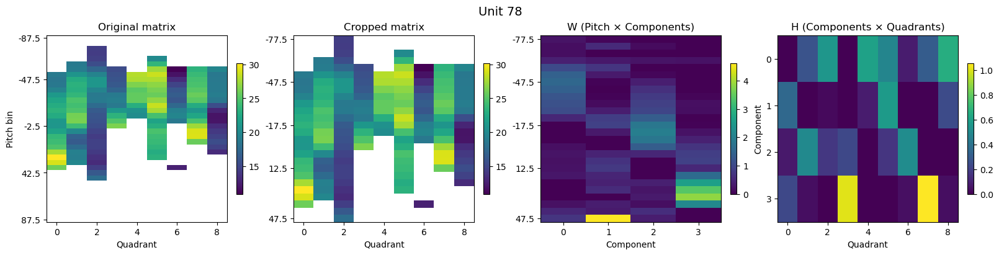

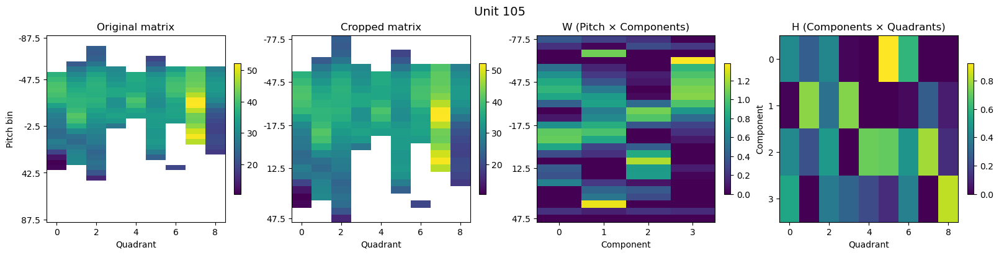

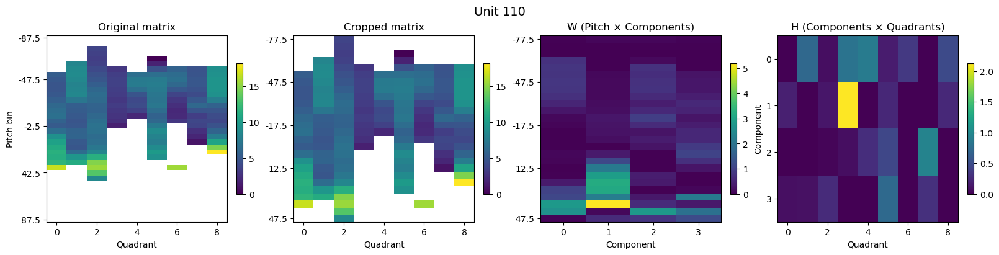

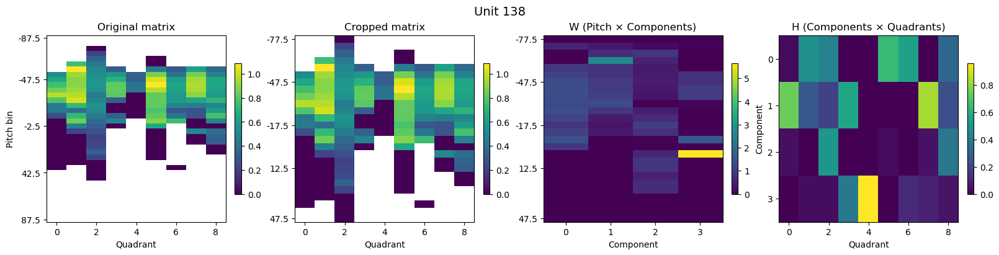

...

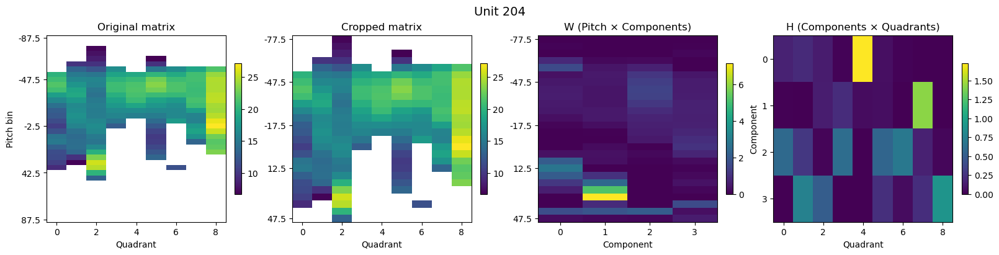

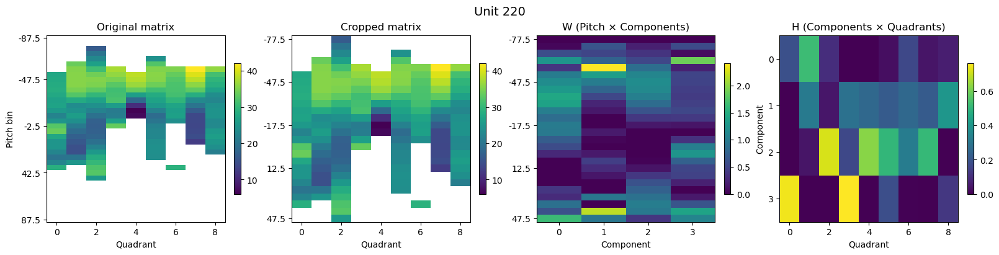

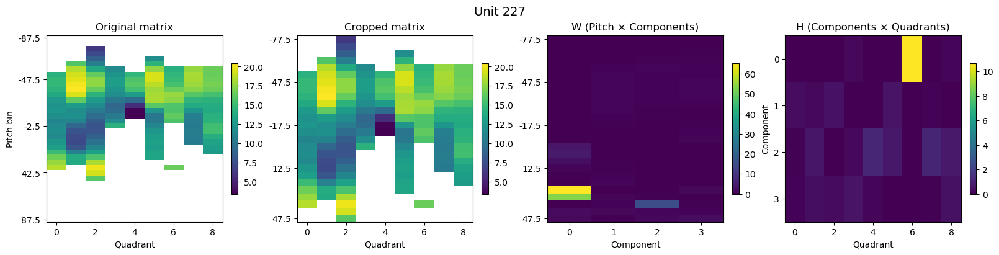

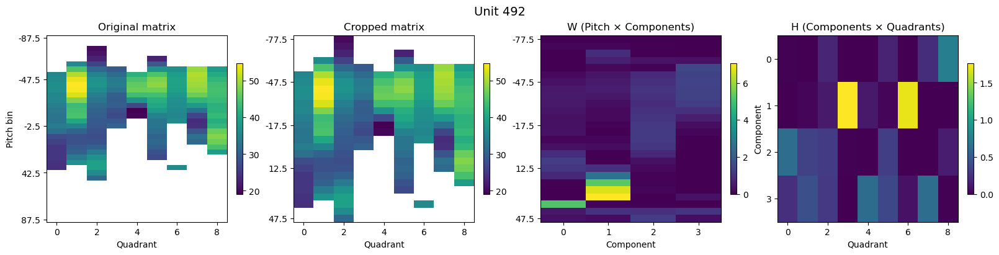

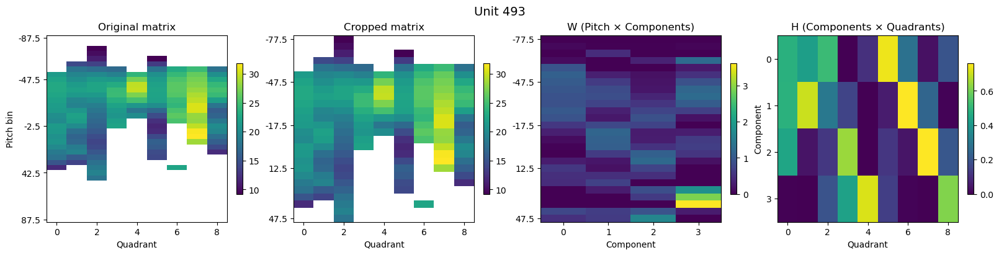

In [84]:
for unit in X_dict.keys():
    try:
        plot_unit_summary(unit, X_dict, cropped_matrices, crop_indices, pitch_centers, W_dict, H_dict)
    except:
        continue

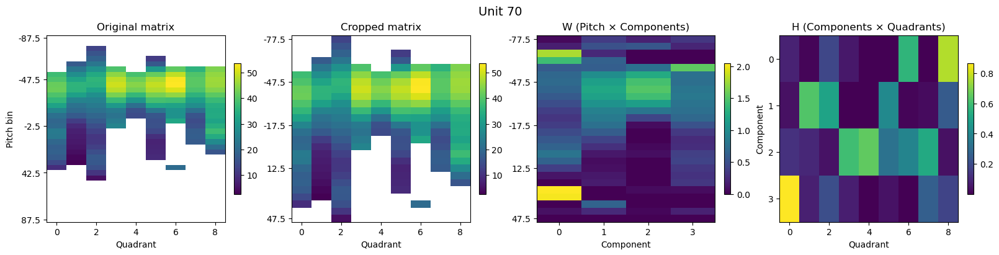

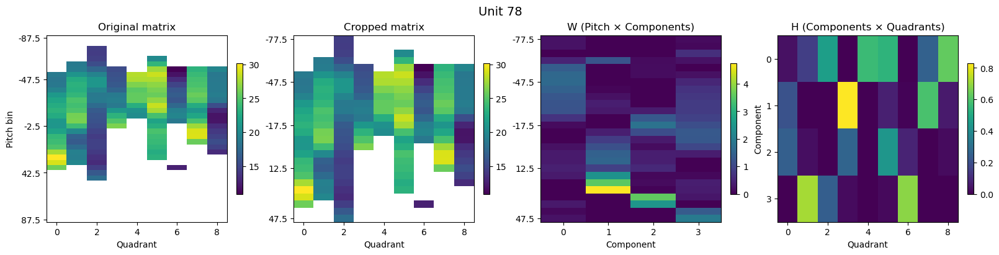

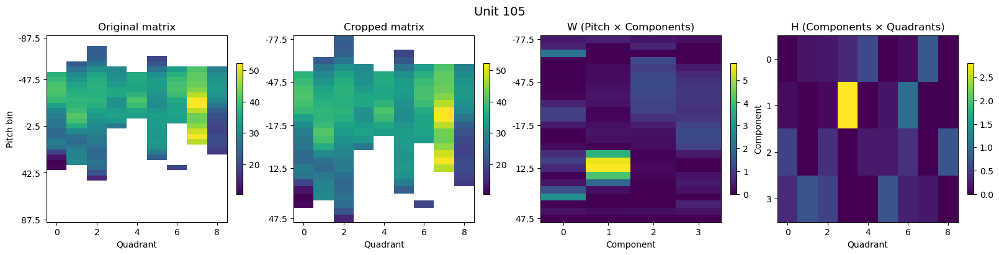

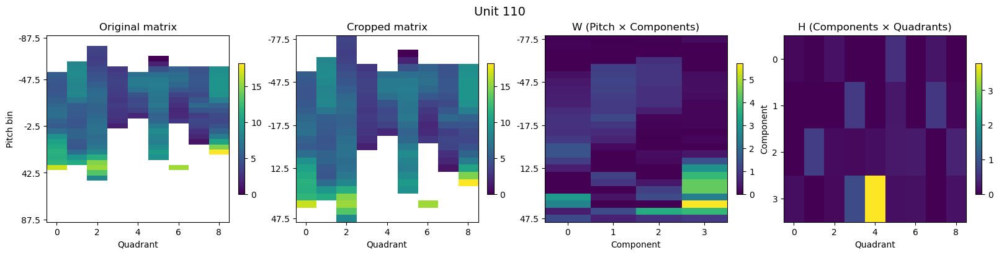

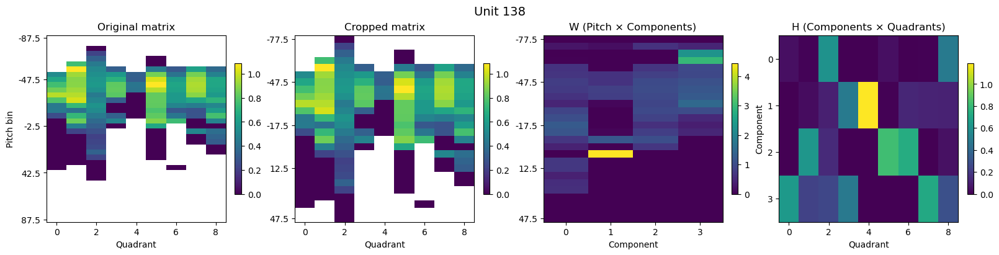

...

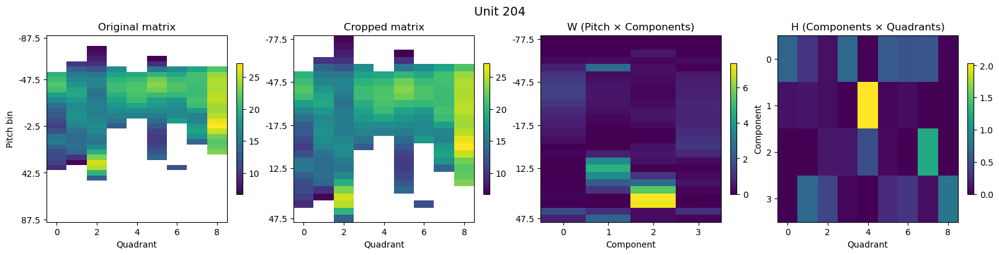

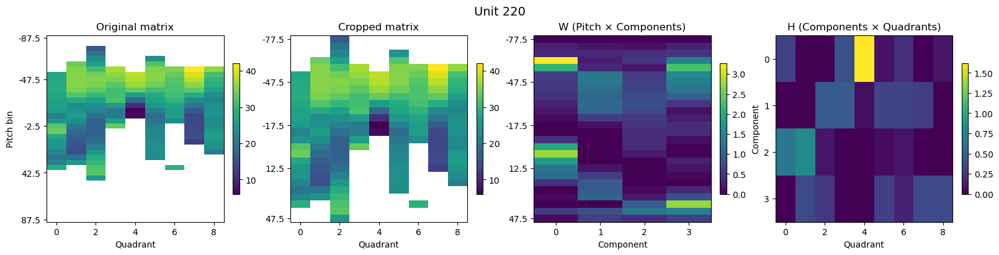

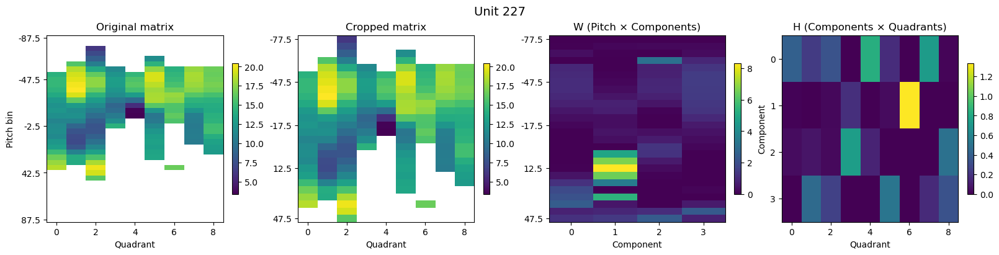

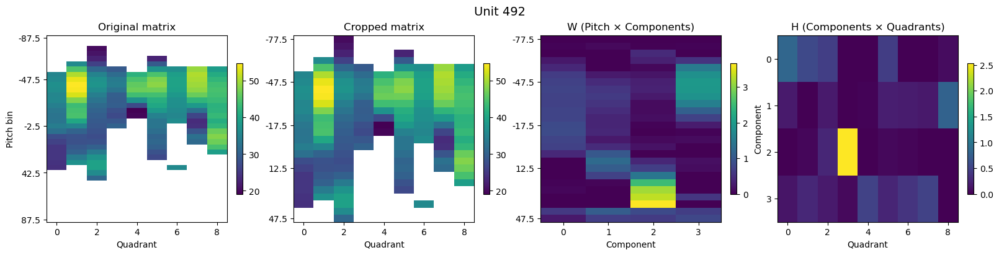

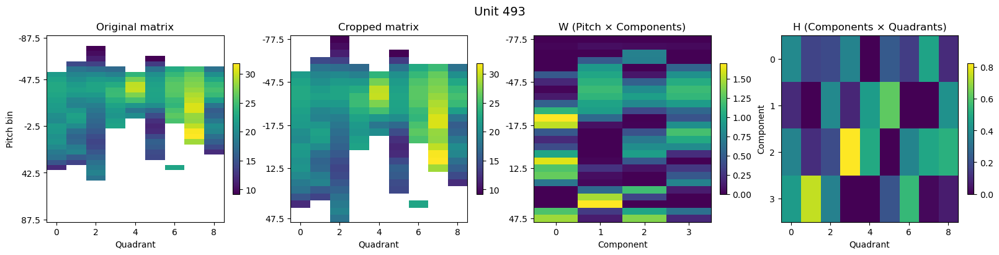

In [86]:
for unit in X_dict.keys():
    try:
        plot_unit_summary(unit, X_dict, cropped_matrices, crop_indices, pitch_centers, W_dict, H_dict)
    except:
        continue

In [118]:
from sklearn.decomposition import NMF
k=2
W_dict = {}
H_dict = {}
for u in inter:
    try:
        X_chop = cropped_matrices[u]
        XX = minmax(X_chop) #minmax(X_chop)
        M = ~np.isnan(XX)
        V = np.ones_like(XX)
        V[(V*M)<=0] = 0
    except:
        

_IncompleteInputError: incomplete input (4100324467.py, line 13)

In [ ]:
k=4
W_dict = {}
H_dict = {}
for u in inter:
    try:
        X_chop = cropped_matrices[u]
        XX = minmax(X_chop) #minmax(X_chop)
        M = ~np.isnan(XX)
        V = np.ones_like(XX)
        V[(V == 0) & M] = 1e-6
        X_filled = np.nan_to_num(XX, nan=0.0)
        model = nmf.NMF(X_filled, V=V, M=M, n_components=k)
        chi2, time_used = model.SolveNMF()
        W_dict[u] = model.W
        H_dict[u] = model.H
    except:
        continue

In [91]:
import numpy as np
from time import time
_largenumber = 1E100
_smallnumber = 1E-5

def _nndsvd(X, n_components, variant="nndsvda", eps=1e-8, random_state=None):
    """
    Nonnegative Double SVD initialization.
    
    Parameters
    ----------
    X : (m, n) ndarray, nonnegative
    n_components : int
    variant : {'nndsvd','nndsvda','nndsvdar'}
        - 'nndsvd':   pure NNDSVD, zeros remain zeros (may zero-lock)
        - 'nndsvda':  fill zeros with small positive constant (avg-based)
        - 'nndsvdar': fill zeros with small random positives (avg-based)
    eps : float
        Numerical floor used to avoid division by zero.
    random_state : int or None
    
    Returns
    -------
    W0 : (m, r) ndarray, nonnegative
    H0 : (r, n) ndarray, nonnegative
    """
    rng = np.random.default_rng(random_state)
    m, n = X.shape
    r = n_components
    if r > min(m, n):
        raise ValueError("n_components must be <= min(X.shape).")

    # Full SVD (you can swap for a truncated SVD if very large)
    U, S, VT = np.linalg.svd(X, full_matrices=False)
    U = U[:, :r]
    S = S[:r]
    VT = VT[:r, :]

    W = np.zeros((m, r), dtype=X.dtype)
    H = np.zeros((r, n), dtype=X.dtype)

    # First component: force nonnegativity by taking positive parts
    up = np.maximum(0, U[:, 0])
    vp = np.maximum(0, VT[0, :])
    up_norm = np.linalg.norm(up) or eps
    vp_norm = np.linalg.norm(vp) or eps
    W[:, 0] = np.sqrt(S[0]) * (up / up_norm)
    H[0, :] = np.sqrt(S[0]) * (vp / vp_norm)

    # Remaining components
    for j in range(1, r):
        u = U[:, j]
        v = VT[j, :]

        u_p = np.maximum(0, u);  u_n = np.maximum(0, -u)
        v_p = np.maximum(0, v);  v_n = np.maximum(0, -v)

        u_p_norm = np.linalg.norm(u_p) or eps
        v_p_norm = np.linalg.norm(v_p) or eps
        u_n_norm = np.linalg.norm(u_n) or eps
        v_n_norm = np.linalg.norm(v_n) or eps

        # Choose the stronger outer product (p,p) vs (n,n)
        alpha = u_p_norm * v_p_norm
        beta  = u_n_norm * v_n_norm
        if alpha >= beta:
            uu = u_p / u_p_norm
            vv = v_p / v_p_norm
            sigma = S[j] * alpha
        else:
            uu = u_n / u_n_norm
            vv = v_n / v_n_norm
            sigma = S[j] * beta

        W[:, j] = np.sqrt(sigma) * uu
        H[j, :] = np.sqrt(sigma) * vv

    # Optional zero-filling to avoid zero-lock with multiplicative updates
    if variant.lower() in ("nndsvda", "nndsvdar"):
        Xpos = X[X > 0]
        avg = Xpos.mean() if Xpos.size else eps
        tiny = max(avg * 1e-4, eps)

        if variant.lower() == "nndsvda":
            W[W <= 0] = tiny
            H[H <= 0] = tiny
        else:  # 'nndsvdar'
            W[W <= 0] = tiny * rng.random(np.count_nonzero(W <= 0))
            H[H <= 0] = tiny * rng.random(np.count_nonzero(H <= 0))

    # Final guards
    W = np.maximum(W, eps)
    H = np.maximum(H, eps)
    return W, H

class YourNMFClass:
    def __init__(
        self, X, W=None, H=None, V=None, M=None, n_components=5,
        init: str = "random",           # 'random' | 'nndsvd' | 'nndsvda' | 'nndsvdar'
        random_state: int | None = None # for reproducibility of 'ar' variant
    ):
        self.X = np.copy(X)
        if np.count_nonzero(self.X < 0) > 0:
            print("There are negative values in X. Setting them to zero...", flush=True)
            self.X[self.X < 0] = 0.0

        self.n_components = n_components
        self.maxiters = 1000
        self.tol = _smallnumber

        # V: weights (>=0); default ones
        if V is None:
            self.V = np.ones(self.X.shape)
        else:
            if V.shape != self.X.shape:
                raise ValueError("Initial V(Weight) has wrong shape.")
            self.V = np.copy(V)
        if np.count_nonzero(self.V < 0) > 0:
            print("There are negative values in V. Setting them to zero...", flush=True)
            self.V[self.V < 0] = 0.0

        # M: mask (bool); default True
        if M is None:
            self.M = np.ones(self.X.shape, dtype=bool)
        else:
            if M.shape != self.X.shape:
                raise ValueError("M(ask) has wrong shape.")
            if M.dtype != bool:
                raise TypeError("M(ask) needs to be boolean.")
            self.M = np.copy(M)

        # Apply mask to weights
        self.V[(self.V * self.M) <= 0] = 0
        self.V_size = np.count_nonzero(self.V)

        # ----- Initialization logic -----
        # If both W and H are provided, trust them (after clipping).
        if W is not None and H is not None:
            if W.shape != (self.X.shape[0], self.n_components):
                raise ValueError("Initial W has wrong shape.")
            if H.shape != (self.n_components, self.X.shape[1]):
                raise ValueError("Initial H has wrong shape.")
            self.W = np.maximum(np.copy(W), 0.0)
            self.H = np.maximum(np.copy(H), 0.0)

        # If neither W nor H provided -> use chosen initializer
        elif W is None and H is None:
            if init.lower().startswith("nndsvd"):
                # Build an SVD-ready view that respects mask/weights
                # Classic NNDSVD is unweighted; here we simply zero-out masked/zero-weight data.
                X_eff = np.copy(self.X)
                X_eff[self.V <= 0] = 0.0

                self.W, self.H = _nndsvd(
                    X_eff, self.n_components, variant=init.lower(),
                    eps=1e-8, random_state=random_state
                )
            else:
                # Random nonnegative init
                self.W = np.random.rand(self.X.shape[0], self.n_components)
                self.H = np.random.rand(self.n_components, self.X.shape[1])

        # If only one is provided, keep it and random-init the other
        elif W is None and H is not None:
            if H.shape != (self.n_components, self.X.shape[1]):
                raise ValueError("Initial H has wrong shape.")
            self.H = np.maximum(np.copy(H), 0.0)
            self.W = np.random.rand(self.X.shape[0], self.n_components)
        else:  # H is None and W is not None
            if W.shape != (self.X.shape[0], self.n_components):
                raise ValueError("Initial W has wrong shape.")
            self.W = np.maximum(np.copy(W), 0.0)
            self.H = np.random.rand(self.n_components, self.X.shape[1])

        # Safety clip (avoid exact zeros with multiplicative updates)
        self.W[self.W < 0] = 0.0
        self.H[self.H < 0] = 0.0
    @property
    def cost(self):
        """
        Total cost of a given set s
        """
        diff = self.X - np.dot(self.W, self.H)
        chi2 = np.einsum('ij,ij', self.V*diff, diff)/self.V_size
        return chi2
    def SolveNMF(self, W_only=False, H_only=False, sparsemode=False, maxiters=None, tol=None, debug=False):
        """
        Construct the NMF basis

        Keywords:
            -- W_only: Only update W, assuming H is known
            -- H_only: Only update H, assuming W is known
               -- Only one of them can be set
        Optional Input:
            -- tol: convergence criterion, default 1E-5
            -- maxiters: allowed maximum number of iterations, default 1000

        Output: 
            -- chi2: reduced final cost
            -- time_used: time used in this run


        """

        t0 = time()

        if (maxiters is not None): 
            self.maxiters = maxiters
        if (tol is not None):
            self.tol = tol

        chi2 = self.cost
        oldchi2 = _largenumber

        if (W_only and H_only):
            print("Both W_only and H_only are set to be True. Returning ...", flush=True)
            return (chi2, 0.)

        if (sparsemode == True):
            V = sparse.csr_matrix(self.V)
            VT = sparse.csr_matrix(self.V.T)
            multiply = sparse.csr_matrix.multiply
            dot = sparse.csr_matrix.dot
        else:
            V = np.copy(self.V)
            VT = V.T
            multiply = np.multiply
            dot = np.dot

        #XV = self.X*self.V
        XV = multiply(V, self.X)
        XVT = multiply(VT, self.X.T)

        niter = 0

        while (niter < self.maxiters) and ((oldchi2-chi2)/oldchi2 > self.tol):

            # Update H
            if (not W_only):
                #H_up = np.dot(self.W.T, XV)
                #H_down = np.dot(self.W.T, np.dot(self.W, self.H)*self.V)

                H_up = dot(XVT, self.W)
                WHVT = multiply(VT, np.dot(self.W, self.H).T)
                H_down = dot(WHVT, self.W)
                # self.H = self.H*H_up.T/H_down.T
                eps = 1e-8
                self.H = self.H * H_up.T / (H_down.T + eps)

            # Update W
            if (not H_only):
                #W_up = np.dot(XV, self.H.T)
                #W_down = np.dot(np.dot(self.W, self.H)*self.V, self.H.T)

                W_up = dot(XV, self.H.T)
                WHV = multiply(V, np.dot(self.W, self.H))
                W_down = dot(WHV, self.H.T)
                eps=1e-8
                self.W = self.W * W_up / (W_down + eps)
                # self.W = self.W*W_up/W_down

            # chi2
            oldchi2 = chi2
            chi2 = self.cost

            # Some quick check. May need its error class ...
            if (not np.isfinite(chi2)):
                print(f'{(niter < self.maxiters)=},{niter=}')
                print(f'{((oldchi2-chi2)/oldchi2 > self.tol)=},{((oldchi2-chi2)/oldchi2)=}')
                raise ValueError("NMF construction failed, likely due to missing data")
        
            if ((np.mod(niter, 20)==0) and debug):
                print("Current Chi2={0:.4f}, Previous Chi2={1:.4f}, Change={2:.4f}% @ niters={3}".format(chi2,oldchi2,(oldchi2-chi2)/oldchi2*100.,niter), flush=True)

            niter += 1
            if (niter == self.maxiters):
                print("Iteration in re-initialization reaches maximum number = {0}".format(niter), flush=True)
        #EL PATCHO
        
        time_used = (time()-t0)/60.
        print("Took {0:.3f} minutes to reach current solution.".format(time_used), flush=True)

        return (chi2, time_used)


In [123]:
k=2
W_dict = {}
H_dict = {}
for u in inter:
    try:
        X_chop = cropped_matrices[u]
        XX = minmax(X_chop) #minmax(X_chop)
        M = ~np.isnan(XX)
        V = np.ones_like(XX)
        V[(V == 0) & M] = 1e-6
        X_filled = np.nan_to_num(XX, nan=0.0)
        model = YourNMFClass(X_filled, V=V, M=M, n_components=k, init="nndsvd")
        chi2, time_used = model.SolveNMF()
        W_dict[u] = model.W
        H_dict[u] = model.H
    except Exception as e:
        print(e)
        continue

Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.


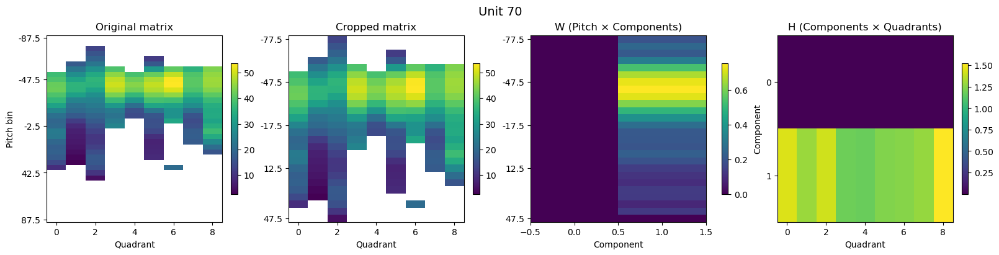

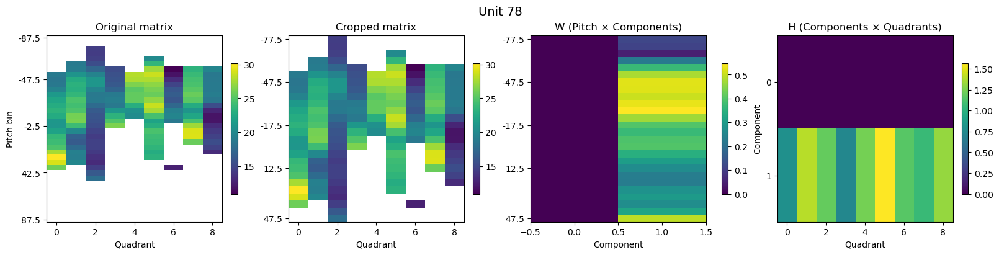

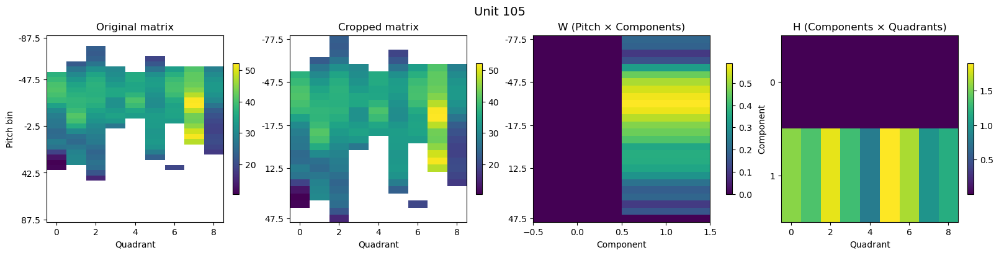

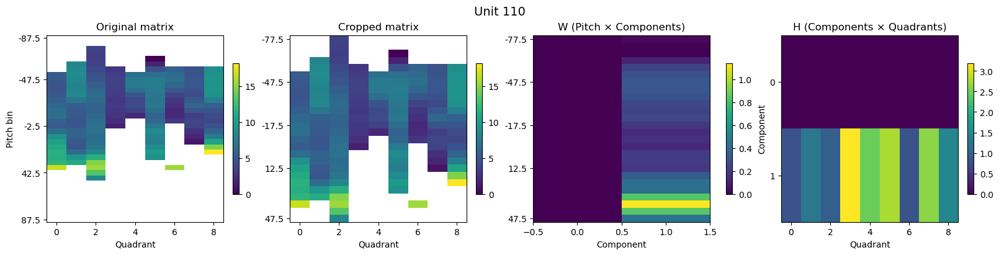

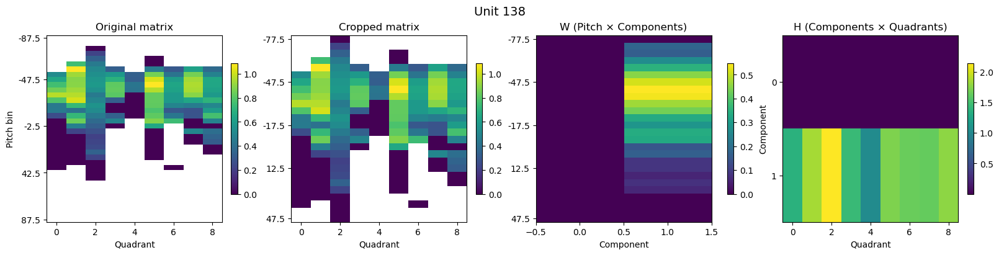

...

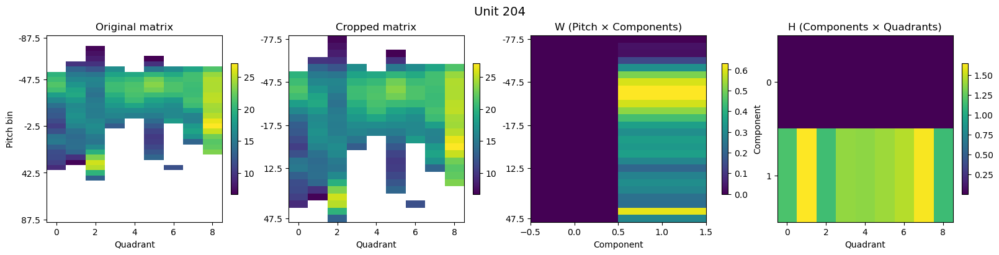

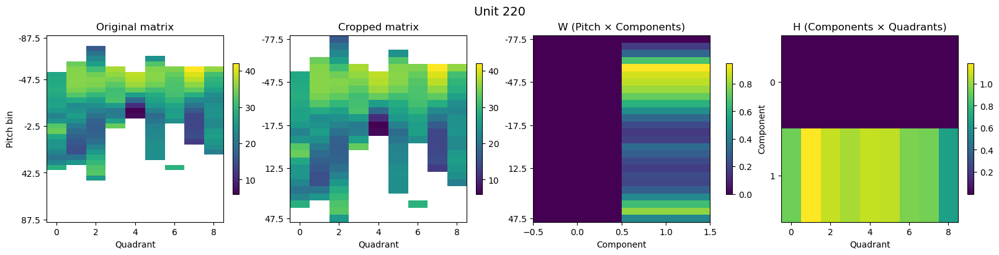

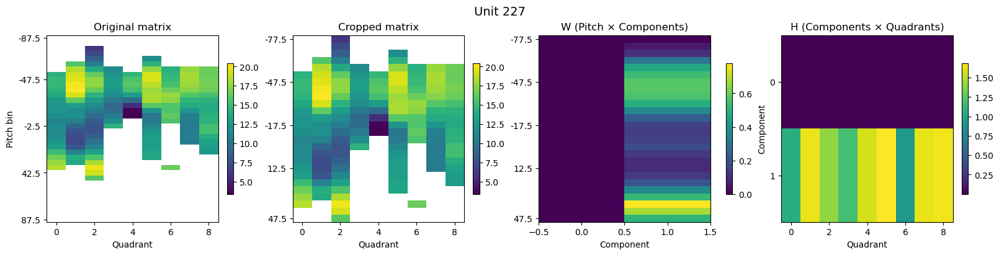

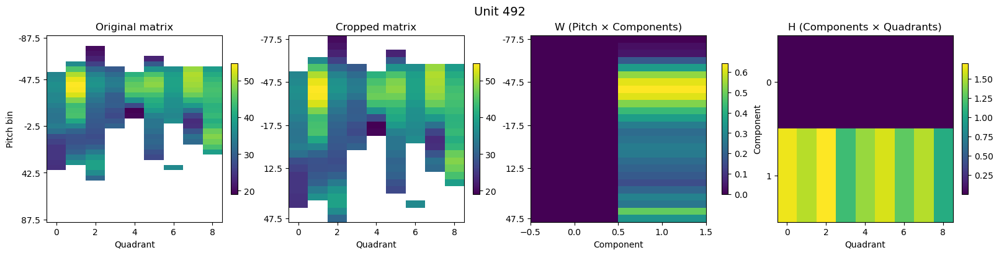

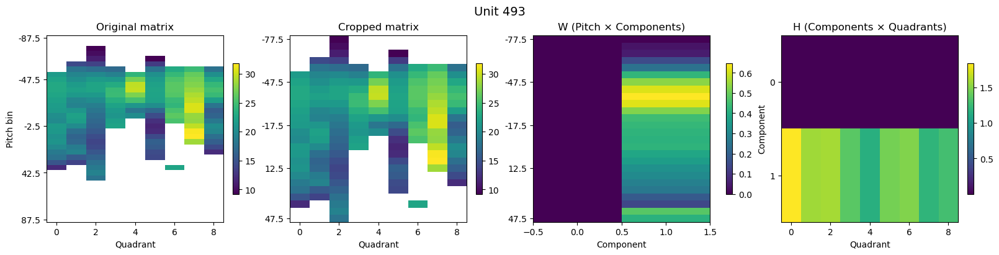

In [124]:
for unit in X_dict.keys():
    try:
        plot_unit_summary(unit, X_dict, cropped_matrices, crop_indices, pitch_centers, W_dict, H_dict)
    except:
        continue

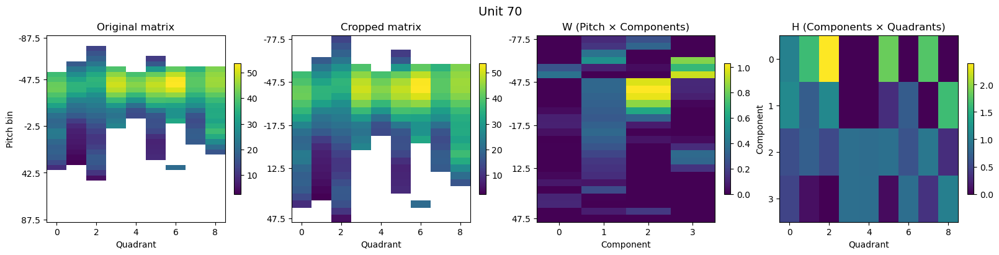

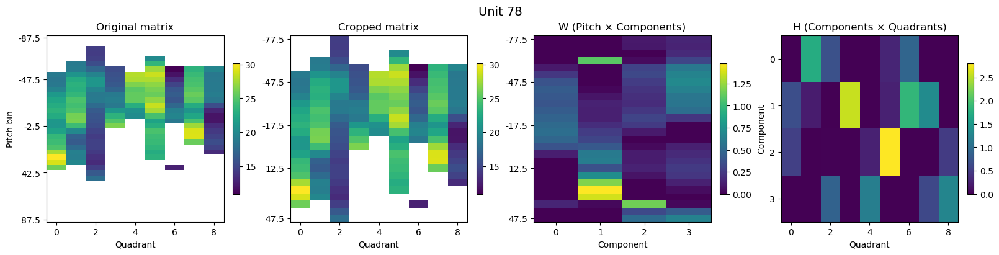

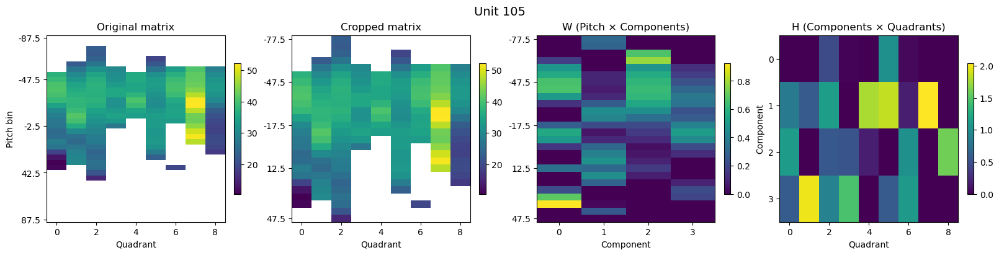

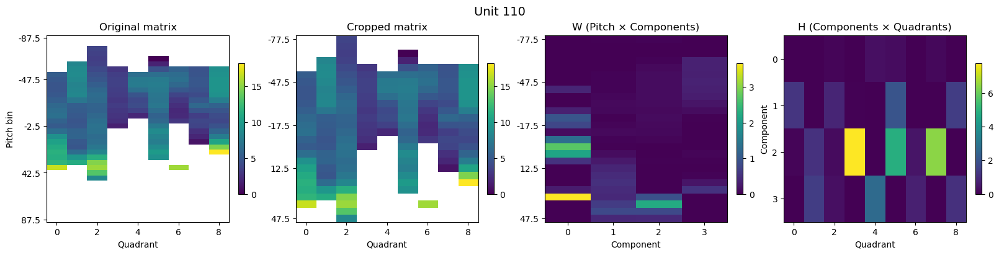

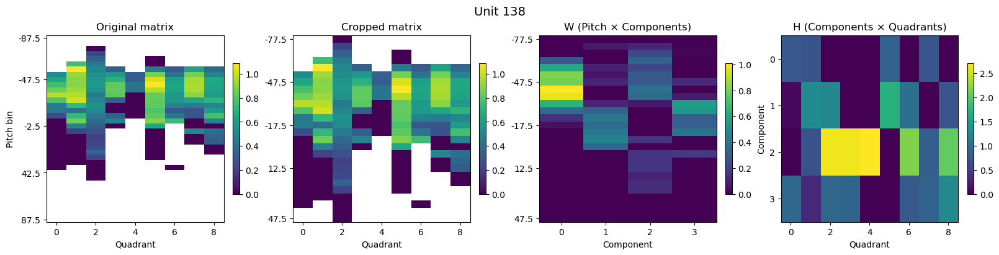

...

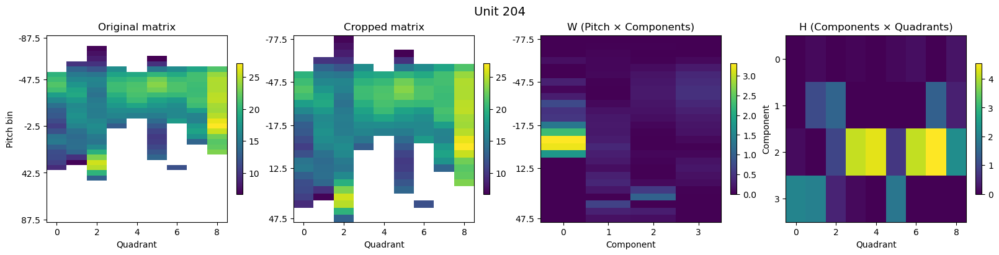

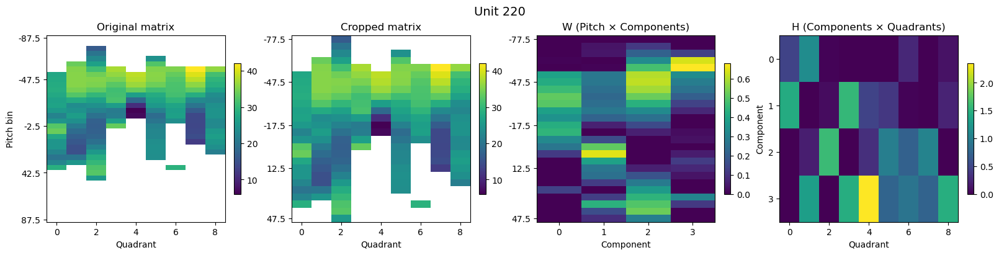

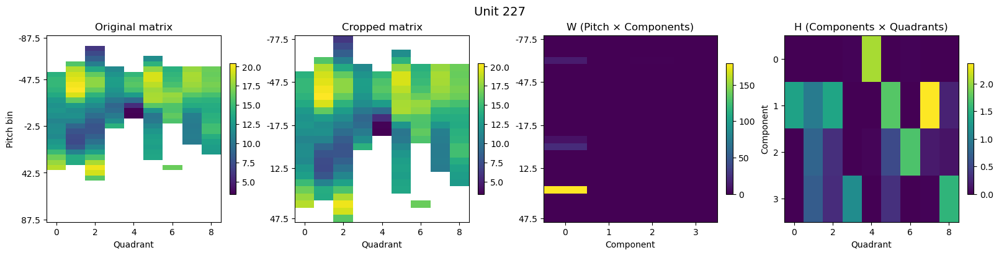

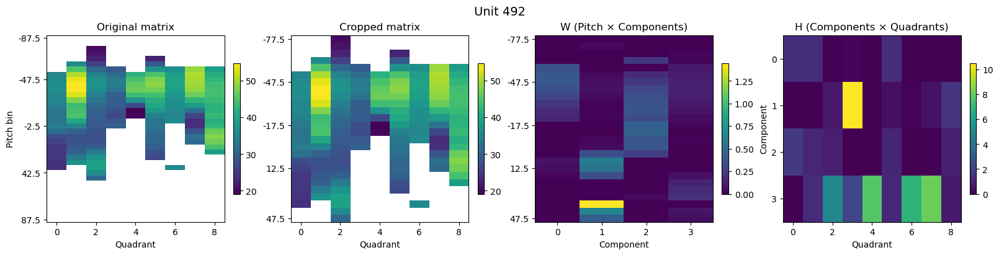

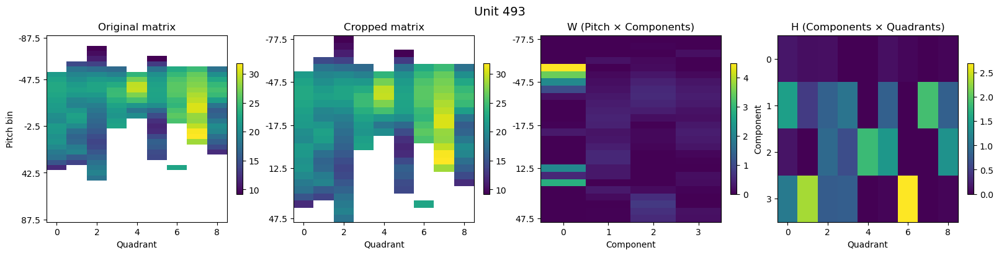

In [104]:
for unit in X_dict.keys():
    try:
        plot_unit_summary(unit, X_dict, cropped_matrices, crop_indices, pitch_centers, W_dict, H_dict)
    except:
        continue

Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.
Iteration in re-initialization reaches maximum number = 1000
Took 0.002 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Took 0.000 minutes to reach current solution.
Iteration in re-initi

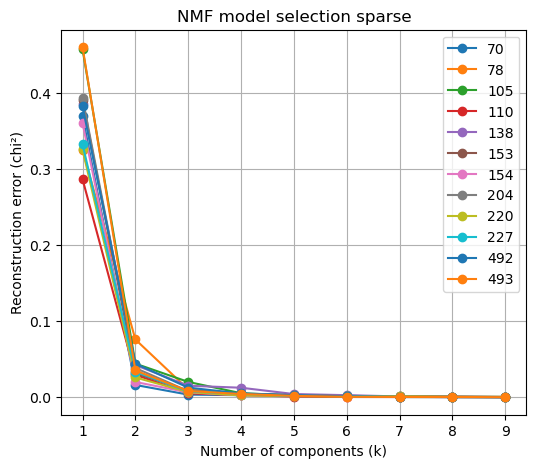

In [115]:
k_range = range(1, 10)
chik_dict = {}

for u in inter:
    X_chop=cropped_matrices[u]
    try:
        XX = minmax(X_chop) #minmax(X_chop)
        M = ~np.isnan(XX)
        V = np.ones_like(XX)
        V[(V == 0) & M] = 1e-6
        X_filled = np.nan_to_num(XX, nan=0.0)
        errors = []
        for k in k_range:
            model = YourNMFClass(X_filled, V=V, M=M, n_components=k, init="nndsvd")
            chi2, time_used = model.SolveNMF()
            errors.append(chi2)

        chik_dict[u] = errors
    except:
        chik_dict[u] = None
        print(f'failed to process unit {u}')
plt.figure(figsize=(6,5))
print(chik_dict) 
for u in chik_dict.keys():
    try:
        plt.plot(k_range, chik_dict[u], marker='o', label=u)
    except Exception as e:
        print(e)
        continue
plt.xlabel('Number of components (k)')
plt.ylabel('Reconstruction error (chi²)')
plt.legend()
plt.title('NMF model selection sparse')
plt.grid(True)
plt.show()

## Rank

In [ ]:
v

array([0.12968998, 0.12969173, 0.12969523, ..., 0.0043147 , 0.00431466,
       0.00431463], shape=(220314,))

In [ ]:
pitch

array([-48.4039854 , -48.40342441, -48.40230094, ...,   9.62115492,
         9.62118066,   9.62119365], shape=(220314,))

In [ ]:
from scipy.stats import rankdata

v_rank = rankdata(v, method='average')
p_rank = rankdata(pitch, method='average')

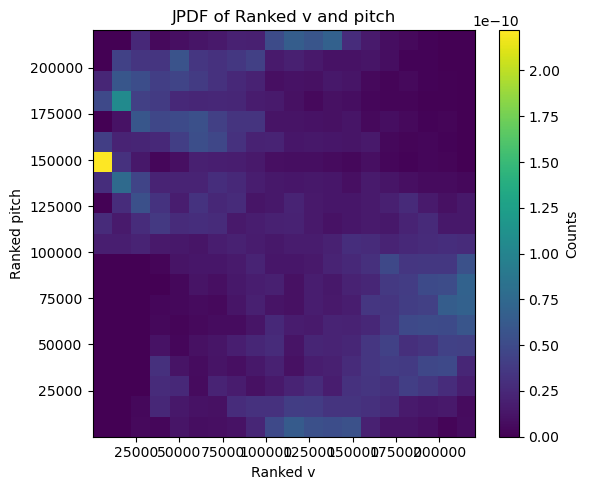

In [ ]:
bins = 20
'''
density
False: the default, returns the number of samples in each bin. 
True: returns pdf at the bin, bin_count / sample_count / bin_area.
'''
H, xedges, yedges = np.histogram2d(v_rank, p_rank, bins=bins, density=True)

# Plot with imshow
plt.figure(figsize=(6, 5))
plt.imshow(H.T, origin='lower', aspect='auto', cmap='viridis',
           extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
plt.xlabel("Ranked v")
plt.ylabel("Ranked pitch")
plt.title("JPDF of Ranked v and pitch")
plt.colorbar(label="Counts")
plt.tight_layout()
plt.show()

In [ ]:
import seaborn as sns
import pandas as pd

In [ ]:
df = pd.DataFrame({'Speed':v_rank , 'Pitch':p_rank})

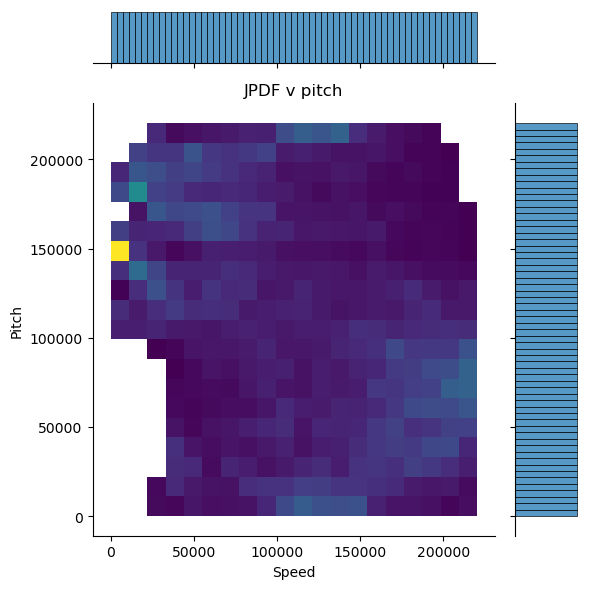

In [ ]:
g = sns.jointplot(x='Speed', y='Pitch', data=df, kind='hist', bins=20)
for coll in g.ax_joint.collections:
    coll.set_cmap('viridis')
g.ax_joint.set_title("JPDF v pitch")
plt.tight_layout()
plt.show()